# Semantic Segmentation using UNet

# **Import Libraries**

In [3]:
from tensorflow.python import keras
print(keras.__version__)

2.6.0


In [4]:
import tensorflow as tf

In [5]:
print(tf.keras.__version__)

2.12.0


In [6]:
print(tf.__version__)

2.12.0


In [7]:
import os, glob
import cv2, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
#from patchify import patchify
from PIL import Image
#import segmentation_models as sm
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.utils import normalize
from tensorflow.keras.models import load_model
from tqdm import tqdm
from random import sample
import pickle
from tensorflow.keras.callbacks import Callback, ModelCheckpoint,  EarlyStopping
from tensorflow.keras.optimizers import SGD, Adam
from sklearn.preprocessing import LabelEncoder
from keras.utils import normalize
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight

***Getting Colour Labels***

In [8]:
dfs = pd.read_excel("/kaggle/input/new-selected/Selected_category.xlsx","Sheet2")

In [9]:
dfs

,Idx,Ratio,Train,Val,Stuff,"Color_Code (R,G,B)",Color_Code(hex),Color,Name,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,2,0.1072,6046,612,1,"(180, 120, 120)",#B47878,NaN,building,NaN,NaN,NaN,NaN,3.0
1,3,0.0878,8265,796,1,"(6, 230, 230)",#06E6E6,NaN,sky,NaN,NaN,NaN,NaN,NaN
2,5,0.0480,6678,641,0,"(4, 200, 3)",#04C803,NaN,tree,NaN,NaN,NaN,NaN,NaN
3,6,0.0450,6604,643,1,"(120, 120, 80)",#787850,NaN,ceiling,NaN,NaN,NaN,NaN,NaN
4,7,0.0398,4023,408,1,"(140, 140, 140)",#8C8C8C,NaN,road;route,NaN,NaN,NaN,NaN,NaN
5,10,0.0183,2423,225,1,"(4, 250, 7)",#04FA07,NaN,grass,NaN,NaN,NaN,NaN,NaN
6,12,0.0166,3068,310,1,"(235, 255, 7)",#EBFF07,NaN,sidewalk,NaN,NaN,NaN,NaN,NaN
7,13,0.0160,5075,526,0,"(150, 5, 61)",#96053D,NaN,person,NaN,NaN,NaN,NaN,NaN
8,17,0.0109,1691,160,1,"(143, 255, 140)",#8FFF8C,NaN,mountain,NaN,NaN,NaN,NaN,NaN
9,21,0.0098,3164,306,0,"(0, 102, 200)",#0066C8,NaN,car,NaN,NaN,NaN,NaN,NaN


In [10]:
CLASS_COLORS = dict(zip(dfs['Idx'], dfs['Color_Code (R,G,B)']))
CLASS_LABELS = dict(zip(dfs['Idx'], dfs['Name']))
class_name_color =dict( zip(dfs['Name'],  dfs['Color_Code (R,G,B)']))

In [11]:
Label = list(dfs["Name"])
Name =[]

for i in Label:
    Name.append(i)

print(*Name,sep="\n")

building
sky
tree
ceiling
road;route
grass
sidewalk
person
mountain
car
water
house
sea


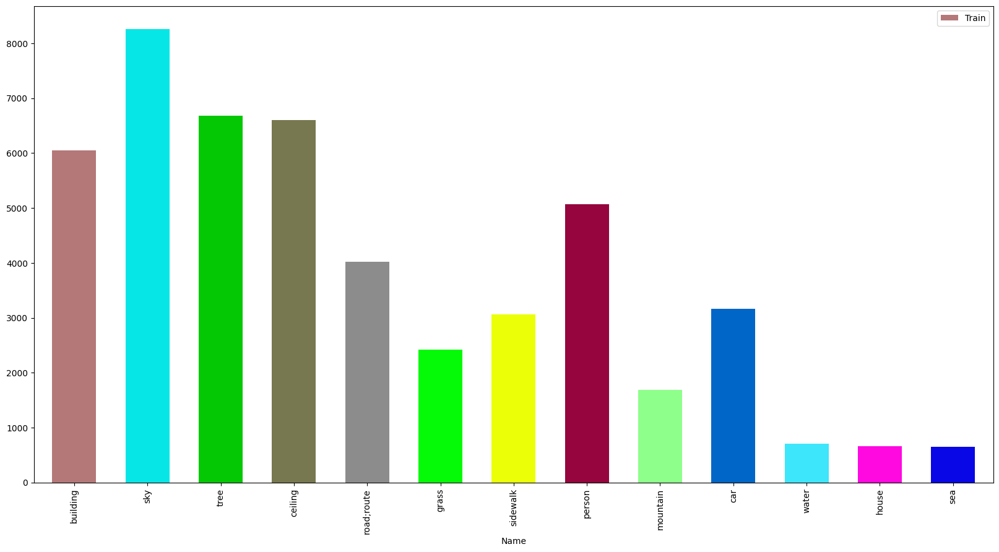

In [17]:
dfs.plot.bar(x="Name",y="Train",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

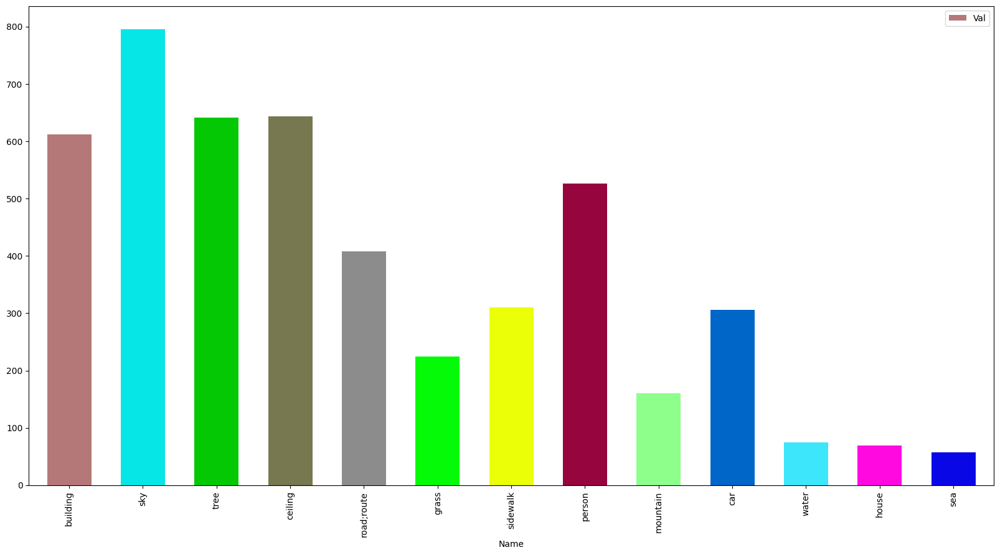

In [16]:
dfs.plot.bar(x="Name",y="Val",color=colors,figsize = (20, 10),width=0.6, align='center')
plt.show()

In [13]:
colors = dfs["Color_Code(hex)"]
colors

0     #B47878
1     #06E6E6
2     #04C803
3     #787850
4     #8C8C8C
5     #04FA07
6     #EBFF07
7     #96053D
8     #8FFF8C
9     #0066C8
10    #3DE6FA
11    #FF09E0
12    #0907E6
Name: Color_Code(hex), dtype: object

In [18]:
class_name_color

{'building': '(180, 120, 120)',
 'sky': '(6, 230, 230)',
 'tree': '(4, 200, 3)',
 'ceiling': '(120, 120, 80)',
 'road;route': '(140, 140, 140)',
 'grass': '(4, 250, 7)',
 'sidewalk': '(235, 255, 7)',
 'person': '(150, 5, 61)',
 'mountain': '(143, 255, 140)',
 'car': '(0, 102, 200)',
 'water': '(61, 230, 250)',
 'house': '(255, 9, 224)',
 'sea': '(9, 7, 230)'}

# **Selecting the Classes and class masks**

**Categories Selected are as follows :**

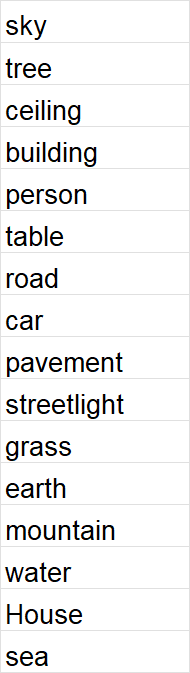

In [19]:
CLASS_LABELS

{2: 'building',
 3: 'sky',
 5: 'tree',
 6: 'ceiling',
 7: 'road;route',
 10: 'grass',
 12: 'sidewalk',
 13: 'person',
 17: 'mountain',
 21: 'car',
 22: 'water',
 26: 'house',
 27: 'sea'}

In [20]:
class_label = {
2: 'building',
3: 'sky',
5: 'tree',
6: 'ceiling',
7: 'road',
10: 'grass',
12: 'sidewalk',
13: 'person',
17: 'mountain',
21: 'car',
22: 'water',
26: 'house',
27: 'sea'}

class_colors = {
    2: (80, 120, 120), 
    3: (6, 230, 230),          
    5: (4, 200, 3),    
    6: (20, 120, 80),    
    7: (140, 140, 140), 
    10: (4, 250, 7), 
    12: (235, 255, 7),
    13: (150, 5, 61),              
    17: (143, 255, 140),    
    21: (0, 102, 200), 
    22: (61, 230, 250),
    26:(255, 9, 224),
    27:(9, 7, 230)              
 
}       

In [21]:
class_colors_keys = list(class_colors.keys())

In [22]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

sky
tree
ceiling
building
person
table
road
car
pavement
streetlight
grass
earth
mountain
water
House
sea

In [23]:
class_colors_keys

[2, 3, 5, 6, 7, 10, 12, 13, 17, 21, 22, 26, 27]

In [254]:
#Training and testing Paths
train_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training"
anno_path = r"/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training"

In [571]:
image_dataset,mask_dataset,masked_image_dataset = [],[],[]

In [ ]:
image = cv2.flip(src, 0)

In [ ]:
def flip_images():
    np.rot90(img)

In [26]:
def load_images_bw_mask(image_path):
    image = cv2.imread(image_path,0)
    #print(image.shape)
    #image = cv2.cvtColor(image)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image

In [27]:
def load_images_bw(image_path):
    image = cv2.imread(image_path,1)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))
    image = Image.fromarray(image)
    image = np.array(image)
    return image


In [28]:
import os
import random

imgExtension = ["png", "jpeg", "jpg"] #Image Extensions to be chosen from
allImages = list()



def chooseRandomImage(directory=train_path):
    for img in os.listdir(directory): #Lists all files
        ext = img.split(".")[len(img.split(".")) - 1]
        if (ext in imgExtension):
            allImages.append(img)
    choice = random.randint(0, len(allImages) - 1)
    chosenImage = allImages[choice] #Do Whatever you want with the image file
    return chosenImage


In [29]:
# File path of the text file to read
file_path = '/kaggle/input/train-data-test-data/train_data.txt'
test_file_path = '/kaggle/input/train-data-test-data/test_data.txt'

# Initialize an empty list to store the file contents
training_images = []
testing_images = []

# Open the file in read mode
with open(file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        training_images.append(line.strip())
        
# Open the file in read mode
with open(test_file_path, 'r') as file:
    # Read each line from the file
    for line in file:
        # Strip any leading or trailing whitespace characters and append the line to the list
        testing_images.append(line.strip())

# Print the list to verify the contents
print("Contents of the file saved to list:")


Contents of the file saved to list:


In [32]:
print(training_images[0])
print(testing_images[0])

ADE_train_00000567.jpg
ADE_train_00000567.png


In [160]:
for i in range(4000):
    train_image_name = chooseRandomImage()
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    image_name = train_image_name.replace('.jpg', '.png')
    
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    print(image_name)
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        mask_dataset.append(mask)
        masked_image_dataset.append(output)
    
    
    
    

KeyboardInterrupt: 

In [572]:
#Read first required images 
for i in range(2008,9009):
    # Load the segmentation mask
    image_name = 'ADE_train_0000'+str(i)+'.png'
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    #print("before: ",np.unique(mask))
    
    #print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = 'ADE_train_0000'+str(i)+'.jpg'
    image = load_images_bw(os.path.join(train_path,train_image_name))
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
    # Calculate background pixels
    background_pixels = np.sum(mask == 0)  # Assuming background is labeled as 0
    
    # Calculate background percentage
    total_pixels = mask.shape[0] * mask.shape[1]
    background_percentage = (background_pixels / total_pixels) * 100
    print(background_percentage)
    
    if (background_percentage>90):
        continue
    else:
        #creating a numpy array of image size 
        output = np.zeros_like(image)

        # Apply colors to the mask based on class labels
        labels = list(class_colors.values())
        for class_label, color in class_colors.items():
            output[mask == class_label] = color
        #Adding Images, masks and Coloured Masks
        image_dataset.append(image[:,:,0])
        mask_dataset.append(mask)
        masked_image_dataset.append(output)
        



67.364501953125
56.658935546875
53.7109375
49.98779296875
69.976806640625
57.537841796875
82.159423828125
52.886962890625
85.6201171875
58.8623046875
63.555908203125
44.793701171875
73.76708984375
36.065673828125
29.345703125
50.091552734375
26.7333984375
70.489501953125
10.25390625
81.695556640625
63.427734375
70.196533203125
22.4365234375
2.50244140625
2.984619140625
4.3701171875
6.231689453125
6.158447265625
12.103271484375
3.3935546875
11.492919921875
64.227294921875
7.745361328125
27.069091796875
62.078857421875
52.288818359375
85.040283203125
78.631591796875
40.4296875
63.897705078125
58.404541015625
73.175048828125
59.088134765625
51.55029296875
98.1689453125
53.25927734375
47.479248046875
49.853515625
56.9580078125
53.35693359375
27.44140625
88.079833984375
97.381591796875
71.990966796875
75.445556640625
98.492431640625
77.783203125
98.822021484375
94.2138671875
26.35498046875
67.755126953125
56.06689453125
36.65771484375
88.037109375
12.53662109375
19.561767578125
49.554443359

In [34]:
#Read first required images 
for i in range(len(training_images)):
    # Load the segmentation mask
    image_name = testing_images[i]
    print(image_name)
    print(os.path.join(anno_path,image_name))
    mask = load_images_bw_mask(os.path.join(anno_path,image_name))
    print("before: ",np.unique(mask))
    
    
    
    # Apply class label changes and relabelling other classes to background
    for label in np.unique(mask):
        if label not in class_colors_keys:
            mask[mask == label] = 0
    
   
    print("After : ",np.unique(mask))
    # Load the Image
    train_image_name = training_images[i]
    print(train_image_name)
    print(os.path.join(train_path,train_image_name))
    image = load_images_bw(os.path.join(train_path,train_image_name)) 
    
    #creating a numpy array of image size 
    output = np.zeros_like(image)
    
    # Apply colors to the mask based on class labels
    labels = list(class_colors.values())
    for class_label, color in class_colors.items():
        output[mask == class_label] = color
    
    #Adding Images, masks and Coloured Masks
    image_dataset.append(image[:,:,0])
    mask_dataset.append(mask)
    masked_image_dataset.append(output)
    


ADE_train_00000567.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000567.png
before:  [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 20 22 25 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 22 27]
ADE_train_00000567.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000567.jpg
ADE_train_00000568.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000568.png
before:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 26
 27]
After :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]
ADE_train_00000568.jpg
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00000568.jpg
ADE_train_00000569.png
/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/annotations/training/ADE_train_00000569.png
before:  [ 0  2  3  8  9 10 11 13 14 15 16 17 18 19 20 21 22 24 25 26 27 28 30 31
 32 35]
After :  [ 0  2  3 10 13 17 21 22 26 27]
ADE_tr

In [478]:
#Masked_iamges
masked_image_dataset[0].shape

(128, 128, 3)

In [574]:
len(image_dataset),len(mask_dataset),len(masked_image_dataset)

(4390, 4390, 4390)

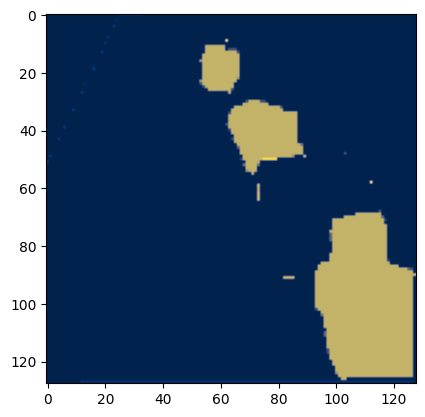

In [575]:
#Mask Image
plt.imshow(mask_dataset[8],cmap='cividis')

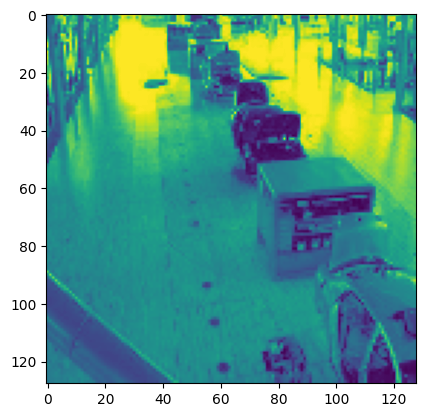

In [576]:
#Image Considering last channel
plt.imshow(image_dataset[8])

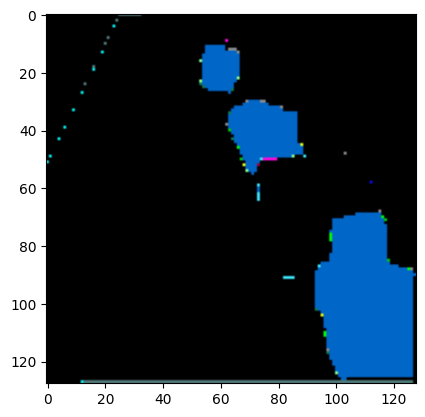

In [577]:
#Masked Image with colours
plt.imshow(masked_image_dataset[8])

In [484]:
np.unique(mask_dataset[0])

array([ 0,  2,  3,  5,  6,  7, 10, 12, 13, 17, 21, 27], dtype=uint8)

In [390]:
masked_image_dataset[0].shape

(128, 128, 3)

In [578]:
n_classes = len(np.unique(mask_dataset))

In [579]:
n_classes

14

2193
[ 0  2  3  5  6  7 10 12 13 17 21 22 26]


Text(0.5, 1.0, 'Mask')

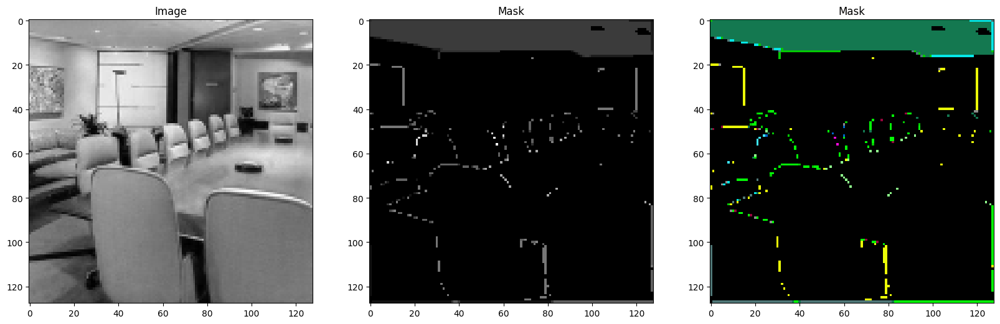

In [580]:
# Sanity check...
import random
image_number = random.randint(0, len(image_dataset))
print(image_number)
print(np.unique(mask_dataset[image_number]))
#image_number=45
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(image_dataset[image_number],cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(mask_dataset[image_number],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[image_number])
plt.title("Mask")

In [581]:
#Convert list to array for machine learning processing
train_images = np.array(image_dataset)
train_images = np.expand_dims(train_images, axis=3)

In [488]:
train_images.shape

(842, 128, 128, 1)

In [582]:
#Convert list to array for machine learning processing
train_masks = np.array(mask_dataset)
train_masks.shape

(4390, 128, 128)

In [583]:
#Encode labels... but multi dim array so need to flatten, encode and reshape
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
print(np.unique(train_masks_reshaped))
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
print(np.unique(train_masks_reshaped_encoded))
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)

[ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [584]:
#Normalising Images
train_images = normalize(train_images,axis=1)#
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [585]:
train_masks_input.shape, train_images.shape


((4390, 128, 128, 1), (4390, 128, 128, 1))

In [586]:
#Train - Test Split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.1, random_state = 42)

In [587]:
X1.shape, X_test.shape, y1.shape, y_test.shape

((3951, 128, 128, 1),
 (439, 128, 128, 1),
 (3951, 128, 128, 1),
 (439, 128, 128, 1))

In [ ]:
np.unique(train_masks_input)

In [495]:
#Number of Unique classes in training masks
n_classes=len(np.unique(train_masks_input))
print(n_classes)

14


In [496]:
#CONVERTING DATA TO CATEGORICAL classes
train_masks_cat = to_categorical(y1, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [497]:
###############################################################
#computing class weights
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_masks_reshaped_encoded), y= train_masks_reshaped_encoded)
print("Class weights are...:", class_weights)

Class weights are...: [ 0.16267594  1.30331002  0.57049694  0.37240581  1.52371292  3.33753521
  1.72563775 12.49325589  5.80072391  3.12779511  8.10205944  7.29123001
  4.80207297 14.0740505 ]


<BarContainer object of 14 artists>

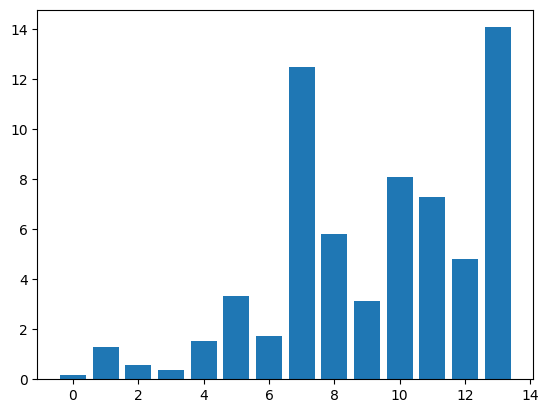

In [498]:
plt.bar([i for i in range(n_classes)], class_weights)

In [408]:
class_weights

array([ 0.12561448,  0.99596838,  0.68487899,  1.3901424 ,  0.96835204,
        4.00148348,  2.36153486, 11.19549394,  2.4604596 ,  5.44645443,
       16.00256986,  4.8420718 ,  6.18321533, 25.32679888])

In [499]:
#Selecting image height, width and channel for neural network
IMG_HEIGHT = X1.shape[1]
IMG_WIDTH  = X1.shape[2]
IMG_CHANNELS = X1.shape[3]
print(IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)

128 128 1


In [500]:
"""
Standard Unet

# https://youtu.be/XyX5HNuv-xE
# https://youtu.be/q-p8v1Bxvac
"""


from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda


################################################################
def multi_unet_model(n_classes=n_classes, IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=1):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)
    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [501]:
from tensorflow.keras import backend as K
# Define custom mean IoU metric function
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)  # Convert predictions to binary values (0 or 1)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2, 3])  # Calculate intersection
    union = K.sum(K.clip(y_true + y_pred, 0, 1), axis=[1, 2, 3])  # Calculate union
    iou = K.mean((intersection + K.epsilon()) / (union + K.epsilon()))  # Calculate IoU
    return iou

# Define custom recall metric function
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# Define custom F1 Score metric function
def f1_score(y_true, y_pred):
    precision = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_pred, 0, 1))) + K.epsilon())
    recall = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_true, 0, 1))) + K.epsilon())
    f1_score = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1_score

In [502]:
#Model Compilation

def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy',mean_iou,recall,f1_score])
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_76 (Conv2D)             (None, 128, 128, 16  160         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_36 (Dropout)           (None, 128, 128, 16  0           ['conv2d_76[0][0]']              
                                )                                                           

In [413]:
type(X1)

numpy.ndarray

In [503]:
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store precision, recall, F1 score, and IoU
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

# Custom callback to compute and store metrics for training and validation sets
class MetricsCallback(Callback):
    def __init__(self, X_train, y_train, X_val, y_val):
        super(MetricsCallback, self).__init__()
        self.val_num = int(0.1*len(X_val))
        print(self.val_num)
        self.X_train = X_train[:self.val_num]
        self.y_train = y_train[:self.val_num]
        self.X_val = X_val[:self.val_num]
        self.y_val = y_val[:self.val_num]
        self.metrics_history = {'train': [], 'val': []}

    def on_epoch_end(self, epoch, logs=None):
        # Compute metrics for training set
        y_train_pred = np.argmax(self.model.predict(self.X_train), axis=-1)
        train_precision = precision_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_recall = recall_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        train_f1 = f1_score(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel(), average='weighted')
        
        confusion_matrix_train = tf.math.confusion_matrix(np.argmax(self.y_train, axis=-1).ravel(), y_train_pred.ravel())
        intersection_train = np.diag(confusion_matrix_train)
        union_train = np.sum(confusion_matrix_train, axis=0) + np.sum(confusion_matrix_train, axis=1) - intersection_train
        train_iou = np.mean((intersection_train + 1e-10) / (union_train + 1e-10))

        # Compute metrics for validation set
        y_val_pred = np.argmax(self.model.predict(self.X_val), axis=-1)
        val_precision = precision_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_recall = recall_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        val_f1 = f1_score(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel(), average='weighted')
        
        confusion_matrix_val = tf.math.confusion_matrix(np.argmax(self.y_val, axis=-1).ravel(), y_val_pred.ravel())
        intersection_val = np.diag(confusion_matrix_val)
        union_val = np.sum(confusion_matrix_val, axis=0) + np.sum(confusion_matrix_val, axis=1) - intersection_val
        val_iou = np.mean((intersection_val + 1e-10) / (union_val + 1e-10))

        self.metrics_history['train'].append({'train_precision': train_precision,
                                              'train_recall': train_recall,
                                              'train_f1': train_f1,
                                              'train_iou': train_iou})
        
        self.metrics_history['val'].append({'val_precision': val_precision,
                                            'val_recall': val_recall,
                                            'val_f1': val_f1,
                                            'val_iou': val_iou})


In [72]:
history.history.keys()

NameError: name 'history' is not defined

In [504]:
import datetime
#CHECKPOINT path for model training 
#Model will be saved if validation accuracy improves 
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Custom callback to compute metrics and save history

metrics_callback = MetricsCallback(X1, y_train_cat, X_test, y_test_cat)

reduce_lr_cback = ReduceLROnPlateau(
    monitor='val_loss', factor=0.2,
    patience=5, verbose=1,
    min_lr=0.05 * 0.0001) 

filepath="/kaggle/working/weights-14-improvement-augmented-images-{epoch:03d}-{val_accuracy:.2f}-{accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, savemode='max')
callbacks_list = [checkpoint,metrics_callback,reduce_lr_cback]


8


In [74]:
#creating folder to save weights
os.mkdir('LOGS')

In [416]:
#Load weights 
model.load_weights("/kaggle/working/weights-14-improvement-augmented-images-015-0.70-0.761.hdf5")

In [505]:
model.load_weights("/kaggle/working/weights-14-improvement-augmented-images-010-0.79-0.819.hdf5")

In [570]:
#Training model
history = model.fit(X1, y_train_cat,
                    batch_size = 16,
                    verbose=1,
                    epochs=50,
                    validation_data=(X_test, y_test_cat),
                    #class_weight=class_weights,
                    callbacks=callbacks_list,
                    shuffle=True)

Epoch 1/50
47/48 [============================>.] - ETA: 0s - loss: 0.6473 - accuracy: 0.7990 - mean_iou: 0.6765 - recall: 0.7557 - f1_score: 0.7956
Epoch 1: val_accuracy did not improve from 0.68500
1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


TypeError: 'float' object is not callable

In [507]:
model.save('unet_weights_14classes_last_no_aug_last.hdf5')

In [508]:
metrics_callback.metrics_history

{'train': [{'train_precision': 0.7388058546475404,
   'train_recall': 0.7595748901367188,
   'train_f1': 0.7379069290075918,
   'train_iou': 0.18445186012942896},
  {'train_precision': 0.7400397820336757,
   'train_recall': 0.762115478515625,
   'train_f1': 0.732666820209322,
   'train_iou': 0.17481025641580597},
  {'train_precision': 0.7792174305288516,
   'train_recall': 0.7630386352539062,
   'train_f1': 0.759080639910933,
   'train_iou': 0.1978458073079629},
  {'train_precision': 0.7771166870332623,
   'train_recall': 0.7744903564453125,
   'train_f1': 0.755710161190097,
   'train_iou': 0.18147420009828755},
  {'train_precision': 0.7720932756557166,
   'train_recall': 0.7427597045898438,
   'train_f1': 0.748531892576479,
   'train_iou': 0.20469775096451734},
  {'train_precision': 0.7797332232613363,
   'train_recall': 0.7724075317382812,
   'train_f1': 0.757786833478842,
   'train_iou': 0.18230430302750197},
  {'train_precision': 0.7838015121806525,
   'train_recall': 0.78337860107

In [291]:
val_precision = []
val_recall = []
val_f1 = []
val_iou = []
train_precision = []
train_recall = []
train_f1 = []
train_iou = []

In [509]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["val"]:
    val_precision.append(metric_data['val_precision'])
    val_recall.append(metric_data['val_recall'])
    val_f1.append(metric_data['val_f1'])
    val_iou.append(metric_data['val_iou'])

Metrics History:


In [510]:
# Accessing metrics history
print("Metrics History:")
for metric_data in metrics_callback.metrics_history["train"]:
    train_precision.append(metric_data['train_precision'])
    train_recall.append(metric_data['train_recall'])
    train_f1.append(metric_data['train_f1'])
    train_iou.append(metric_data['train_iou'])

Metrics History:


In [61]:
'''#tensor board try later
model = create_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x=x_train,
          y=y_train,
          epochs=5,
          validation_data=(x_test, y_test),
          callbacks=[tensorboard_callback])
          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5
          
'''

'#tensor board try later\nmodel = create_model()\nmodel.compile(optimizer=\'adam\',\n              loss=\'sparse_categorical_crossentropy\',\n              metrics=[\'accuracy\'])\n\nlog_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\ntensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)\n\nmodel.fit(x=x_train,\n          y=y_train,\n          epochs=5,\n          validation_data=(x_test, y_test),\n          callbacks=[tensorboard_callback])\n          /kaggle/working/weights-14-improvement-fixed-images-037-0.70.hdf5\n          \n'

In [50]:
#Save weights
model.save('unet_weights_44classes.hdf5')

In [ ]:
/kaggle/working/weights-14-improvement-fixed-images-049-0.68.hdf5

In [511]:
#Evaluation 
_, acc,iou,recall,f1_score = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")
print("mean_iou is = ", (iou * 100.0), "%")
print("recall is = ", (recall * 100.0), "%")
print("f1_score is = ", (f1_score * 100.0), "%")

3/3 [==============================] - 1s 416ms/step - loss: 1.0836 - accuracy: 0.6847 - mean_iou: 0.5408 - recall: 0.6375 - f1_score: 0.6778
Accuracy is =  68.47139000892639 %
mean_iou is =  54.076266288757324 %
recall is =  63.74979019165039 %
f1_score is =  67.77675747871399 %


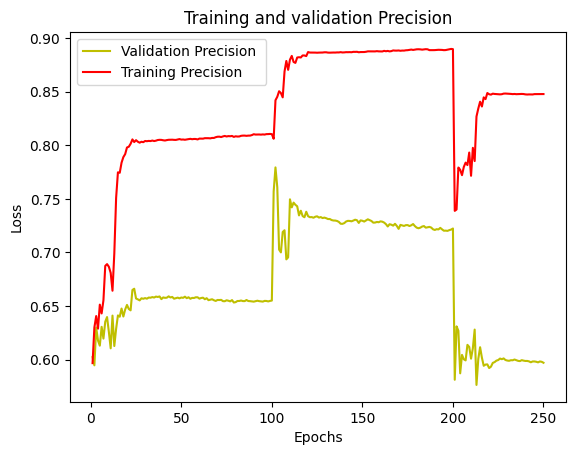

In [512]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_precision) + 1)
plt.plot(epochs, val_precision, 'y', label='Validation Precision ')
plt.plot(epochs, train_precision, 'r', label='Training Precision')
plt.title('Training and validation Precision')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

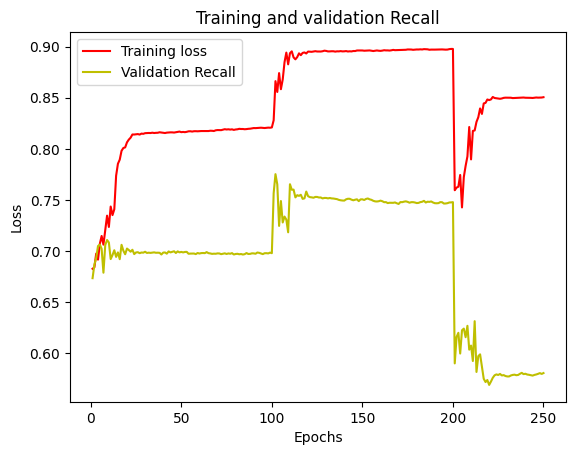

In [513]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_recall) + 1)
plt.plot(epochs, train_recall, 'r', label='Training loss')
plt.plot(epochs, val_recall, 'y', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

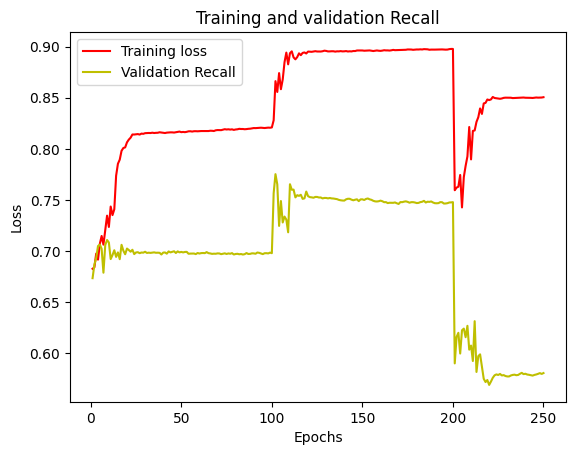

In [514]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_recall) + 1)
plt.plot(epochs, train_recall, 'r', label='Training loss')
plt.plot(epochs, val_recall, 'y', label='Validation Recall')
plt.title('Training and validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

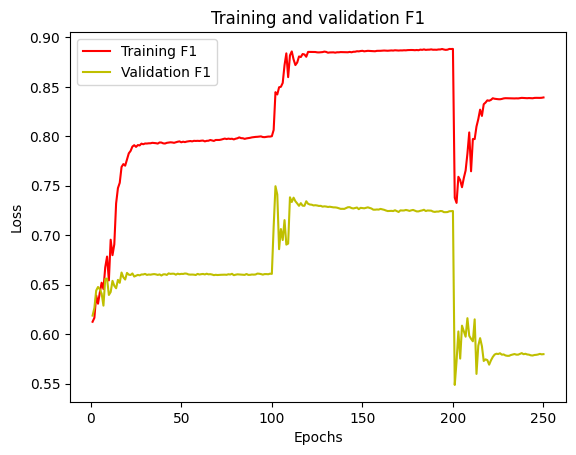

In [515]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_f1) + 1)
plt.plot(epochs, train_f1, 'r', label='Training F1')
plt.plot(epochs, val_f1, 'y', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

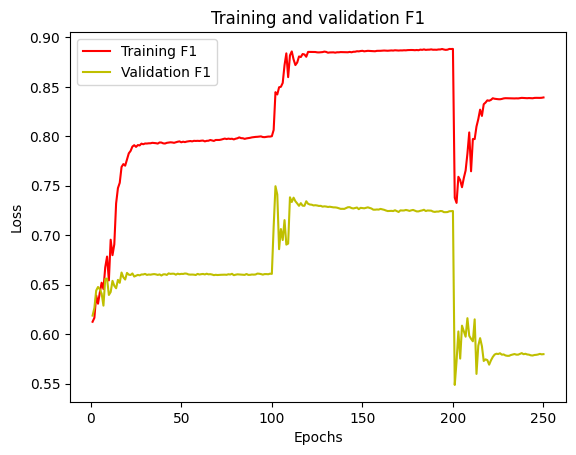

In [516]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_f1) + 1)
plt.plot(epochs, train_f1, 'r', label='Training F1')
plt.plot(epochs, val_f1, 'y', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

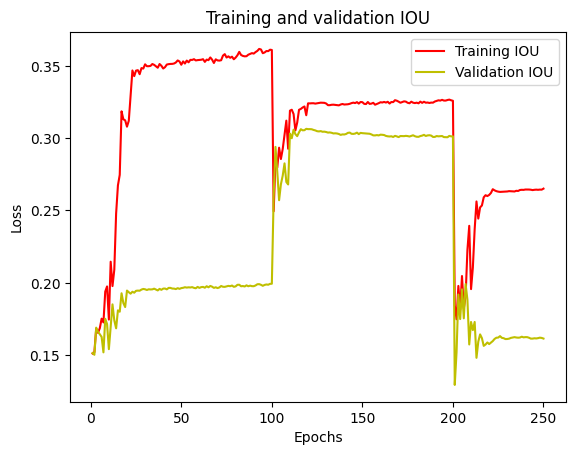

In [517]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_iou) + 1)
plt.plot(epochs, train_iou, 'r', label='Training IOU')
plt.plot(epochs, val_iou, 'y', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

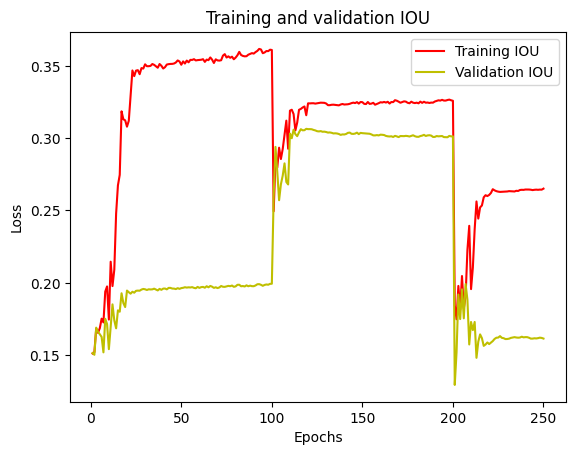

In [518]:
###
#plot the training and validation accuracy and loss at each epoch

epochs = range(1, len(val_iou) + 1)
plt.plot(epochs, train_iou, 'r', label='Training IOU')
plt.plot(epochs, val_iou, 'y', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

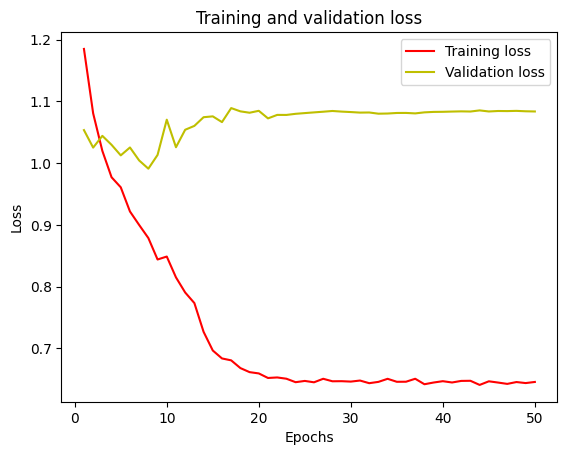

In [520]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

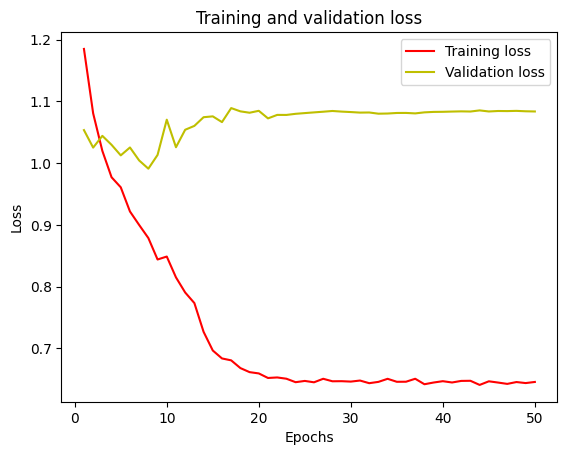

In [521]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

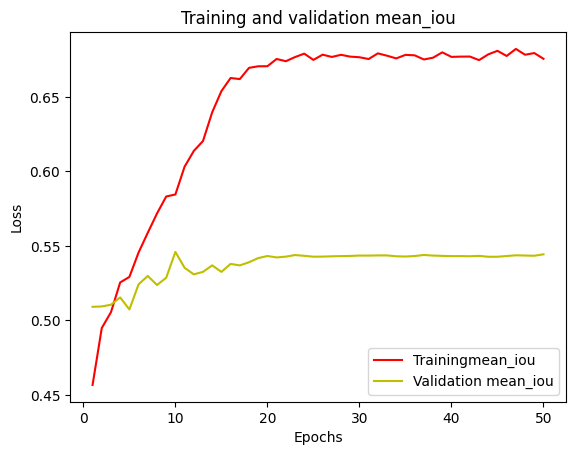

In [522]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['mean_iou']
val_loss = history.history['val_mean_iou']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Trainingmean_iou')
plt.plot(epochs, val_loss, 'y', label='Validation mean_iou')
plt.title('Training and validation mean_iou')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

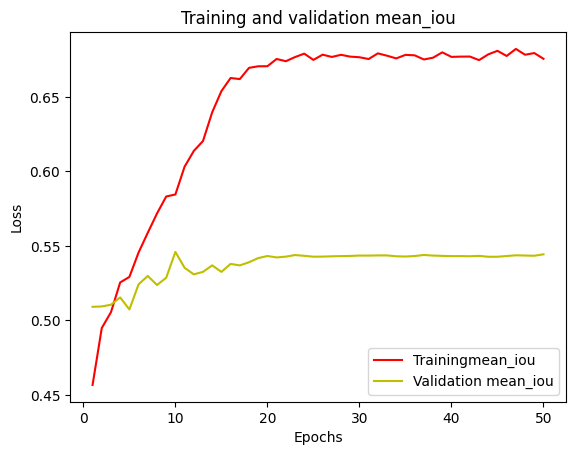

In [523]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['mean_iou']
val_loss = history.history['val_mean_iou']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Trainingmean_iou')
plt.plot(epochs, val_loss, 'y', label='Validation mean_iou')
plt.title('Training and validation mean_iou')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

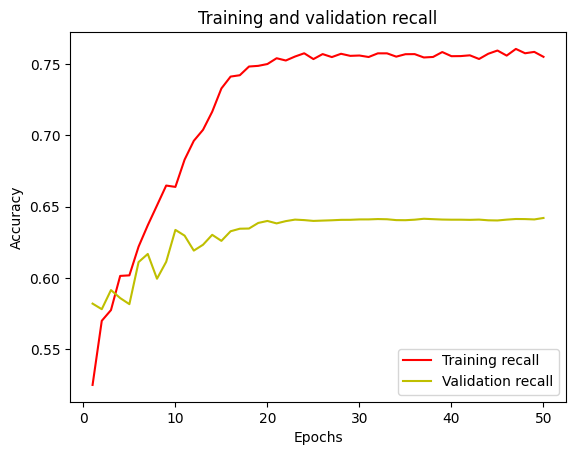

In [524]:
acc = history.history['recall']
val_acc = history.history['val_recall']

plt.plot(epochs, acc, 'r', label='Training recall')
plt.plot(epochs, val_acc, 'y', label='Validation recall')
plt.title('Training and validation recall')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

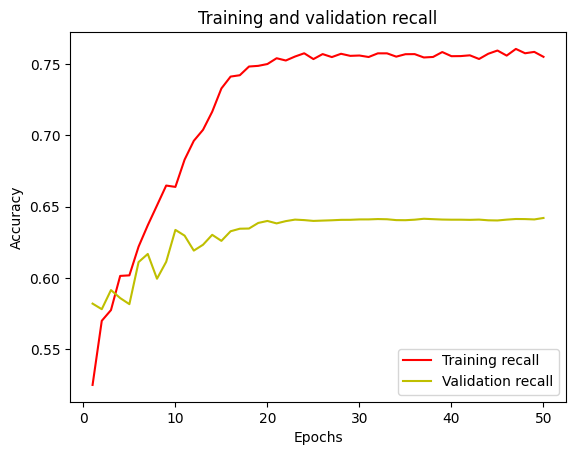

In [525]:
acc = history.history['recall']
val_acc = history.history['val_recall']

plt.plot(epochs, acc, 'r', label='Training recall')
plt.plot(epochs, val_acc, 'y', label='Validation recall')
plt.title('Training and validation recall')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

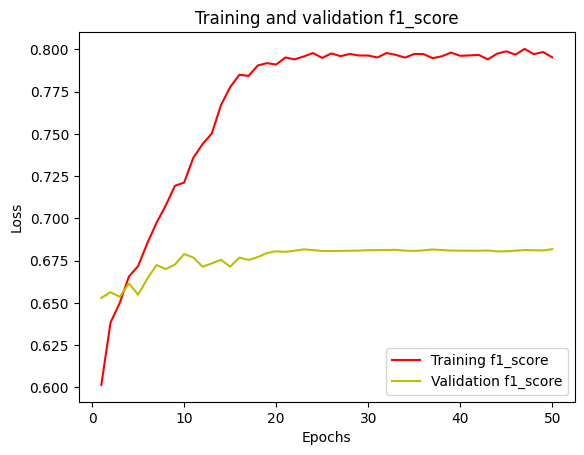

In [526]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1_score')
plt.plot(epochs, val_loss, 'y', label='Validation f1_score')
plt.title('Training and validation f1_score')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

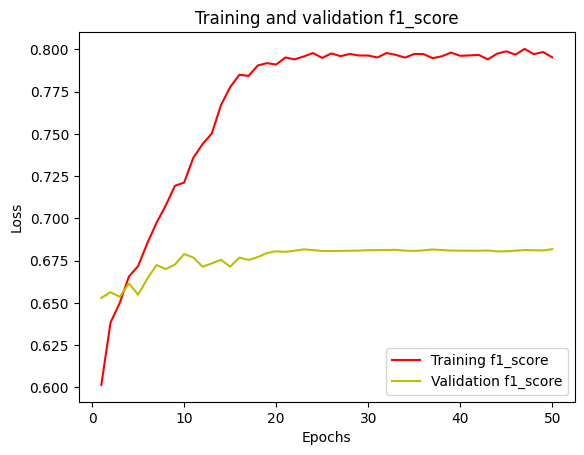

In [528]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1_score')
plt.plot(epochs, val_loss, 'y', label='Validation f1_score')
plt.title('Training and validation f1_score')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

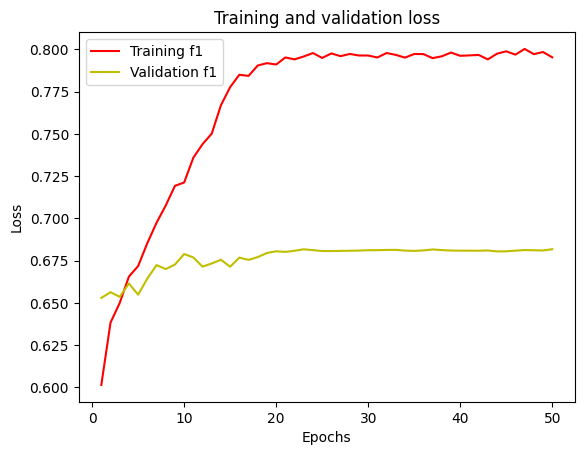

In [529]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1')
plt.plot(epochs, val_loss, 'y', label='Validation f1')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

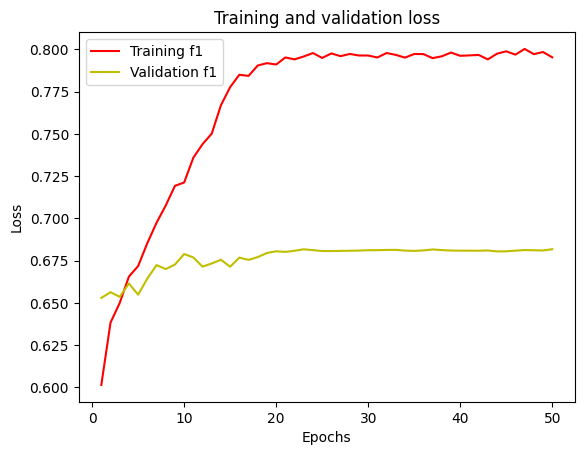

In [530]:
###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['f1_score']
val_loss = history.history['val_f1_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'r', label='Training f1')
plt.plot(epochs, val_loss, 'y', label='Validation f1')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [439]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'mean_iou', 'recall', 'f1_score', 'val_loss', 'val_accuracy', 'val_mean_iou', 'val_recall', 'val_f1_score', 'lr'])

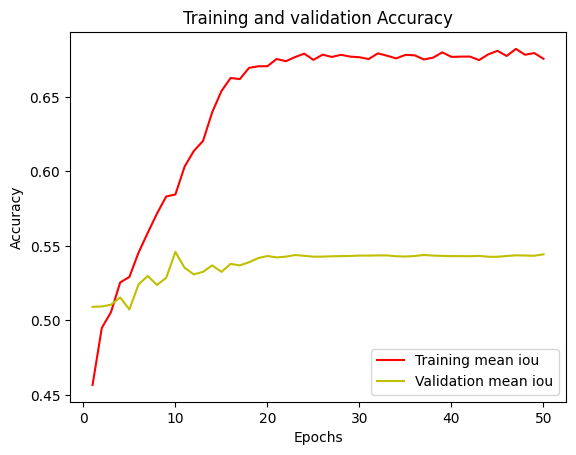

In [531]:
acc = history.history['mean_iou']
val_acc = history.history['val_mean_iou']

plt.plot(epochs, acc, 'r', label='Training mean iou')
plt.plot(epochs, val_acc, 'y', label='Validation mean iou')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

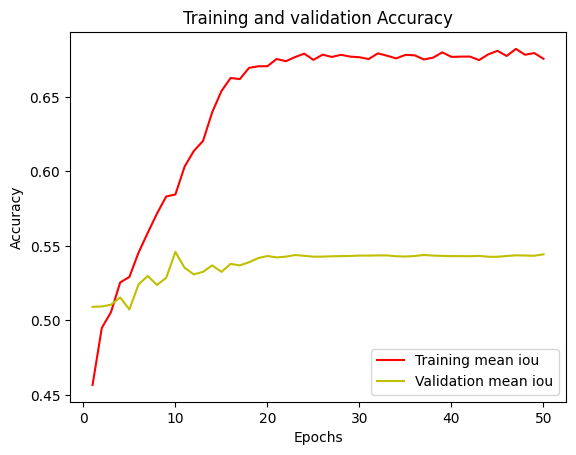

In [532]:
acc = history.history['mean_iou']
val_acc = history.history['val_mean_iou']

plt.plot(epochs, acc, 'r', label='Training mean iou')
plt.plot(epochs, val_acc, 'y', label='Validation mean iou')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
test56.txt

In [ ]:
%tensorboard --logdir '/kaggle/working/LOGS'

In [533]:
#Save history 
my_file = open('./history_.txt','w+')
with open("history_14_12_best.txt", 'w+') as f:
    for key, value in history.history.items():
        f.write('%s:%s\n' % (key, value))


In [444]:
#Save history 
my_file = open('./history_14_test_val.txt','w+')
with open("history_14_test_val_aug.txt", 'w+') as f:
    for key,val in metrics_callback.metrics_history.items():
        f.write('%s: %s' % (key,val))

In [320]:
type(metrics_callback.metrics_history)

dict

In [534]:
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

3/3 [==============================] - 0s 29ms/step


In [535]:
y_test.shape

(85, 128, 128, 1)

In [536]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = n_classes
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.23874679


In [537]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])


print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)


[[4.70531e+05 1.71360e+04 5.71000e+03 4.11860e+04 9.80300e+03 3.33200e+03
  1.09680e+04 0.00000e+00 1.75600e+03 8.24000e+02 0.00000e+00 0.00000e+00
  5.51000e+02 0.00000e+00]
 [2.77510e+04 1.45600e+04 2.15800e+03 5.42000e+03 4.68700e+03 1.80000e+01
  1.86000e+02 0.00000e+00 6.00000e+00 1.31400e+03 0.00000e+00 0.00000e+00
  3.59800e+03 0.00000e+00]
 [1.77740e+04 1.07800e+03 2.03761e+05 1.08950e+04 2.51400e+03 3.00000e+00
  6.60000e+01 0.00000e+00 2.00000e+00 2.39000e+02 0.00000e+00 0.00000e+00
  2.00000e+01 0.00000e+00]
 [5.09420e+04 1.91000e+03 4.77000e+03 1.86589e+05 1.01600e+03 2.50000e+01
  5.12000e+02 0.00000e+00 7.00000e+00 5.70600e+03 6.00000e+00 0.00000e+00
  3.46000e+02 0.00000e+00]
 [1.68460e+04 2.98600e+03 3.19000e+02 1.04000e+02 3.41610e+04 8.00000e+00
  4.00000e+01 0.00000e+00 2.00000e+00 8.00000e+00 0.00000e+00 0.00000e+00
  3.00000e+00 0.00000e+00]
 [2.33270e+04 2.00000e+01 1.36000e+02 3.70000e+02 8.00000e+00 1.36480e+04
  6.72200e+03 0.00000e+00 3.00000e+00 4.80000e+01 0

In [538]:
# Get the confusion matrix from the metric's weights
confusion_matrix = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)

# Compute IoU for each class using the confusion matrix
iou_per_class = np.diag(confusion_matrix) / (np.sum(confusion_matrix, axis=1) + np.sum(confusion_matrix, axis=0) - np.diag(confusion_matrix))

# Print IoU for each class
for i, iou in enumerate(iou_per_class):
    print(f"Class {i}: IoU = {iou:.4f}")

Class 0: IoU = 0.5848
Class 1: IoU = 0.1503
Class 2: IoU = 0.8130
Class 3: IoU = 0.5695
Class 4: IoU = 0.4703
Class 5: IoU = 0.2590
Class 6: IoU = 0.2158
Class 7: IoU = 0.0000
Class 8: IoU = 0.1855
Class 9: IoU = 0.0254
Class 10: IoU = 0.0000
Class 11: IoU = 0.0000
Class 12: IoU = 0.0687
Class 13: IoU = 0.0000


In [102]:
values.shape

(14, 14)

Classes in image :  [ 0  2  3  5  6  7 10 12 13 17 21 22 26 27]


Text(0.5, 1.0, 'Coloured class mask')

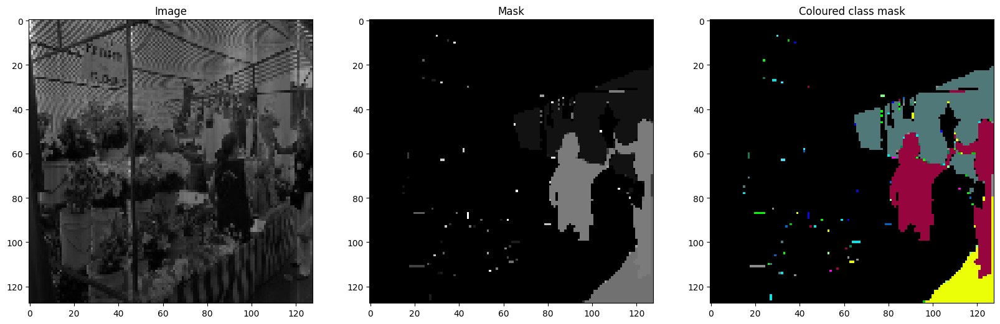

In [539]:
#Sanity check
print("Classes in image : ",np.unique(train_masks))
plt.figure(figsize=(20, 20))
plt.subplot(131)
plt.imshow(train_images[1, :,:,0], cmap='gray')
plt.title("Image")
plt.subplot(132)
plt.imshow(train_masks[1],cmap='gray')
plt.title("Mask")
plt.subplot(133)
plt.imshow(masked_image_dataset[1],cmap='gray')
plt.title("Coloured class mask")

In [540]:
#Randomly selecting images to test
test_img_number = random.randint(0, len(X1))
test_img = X1[test_img_number]
ground_truth=y1[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 30ms/step


Unique classes in test_img Image:  [0.00146772 0.00147933 0.00248959 ... 0.17874355 0.17948646 0.1905619 ]
Unique classes in ground_truth Image:  [0 1 2 3 4 5 6 7 8 9]
Unique classes in Predicted Image:  [0 1 2 3 6]


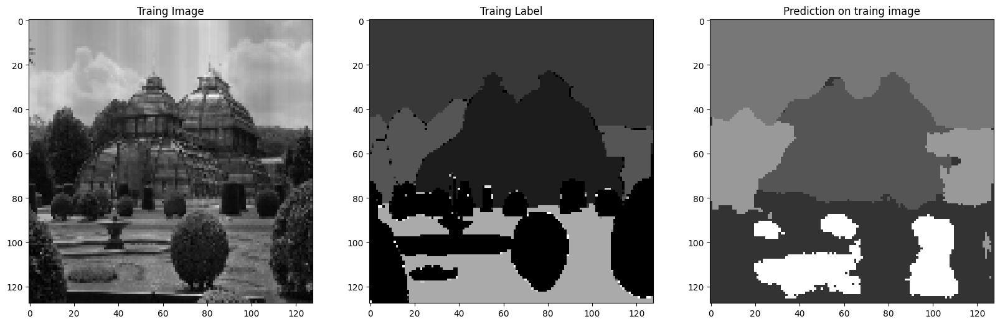

In [541]:
print("Unique classes in test_img Image: ",np.unique(test_img))
print("Unique classes in ground_truth Image: ",np.unique(ground_truth))
print("Unique classes in Predicted Image: ",np.unique(predicted_img))
plt.figure(figsize=(20, 20))
plt.subplot(231)
plt.title('Traing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Traing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')

plt.subplot(233)
plt.title('Prediction on traing image')
#plt.imshow(predicted_img, cmap='jet')


plt.imshow(predicted_img, cmap='gray', alpha=0.8) # interpolation='none'
plt.show()
plt.show()


In [317]:
ground_truth[:,:,0]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [318]:
!pip install visualkeras

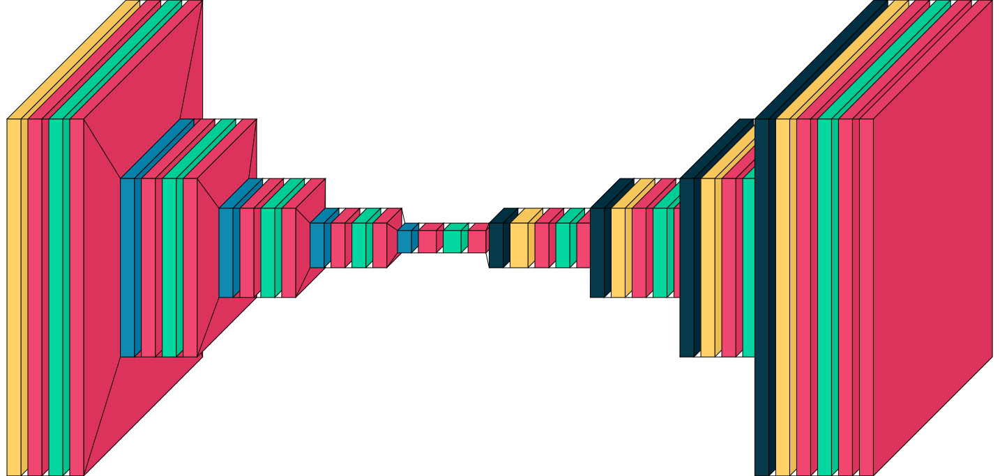

In [111]:
import visualkeras
visualkeras.layered_view(model,to_file='output.png')

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 11 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 12]


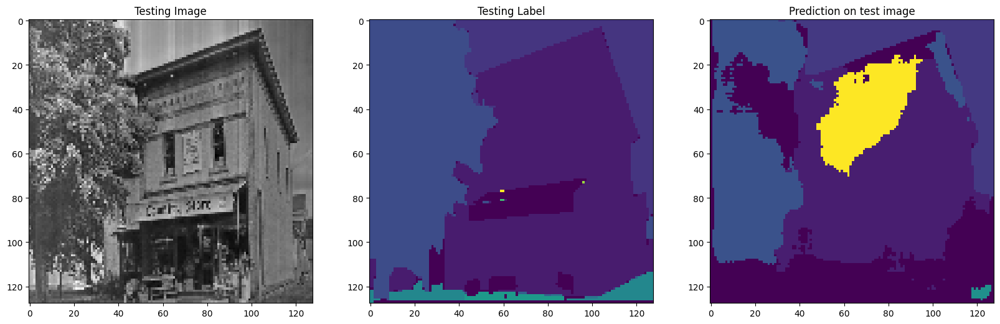

1/1 [==============================] - 0s 32ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8 9]
Unique Classes in predicted taesting image  [0 2 3 9]


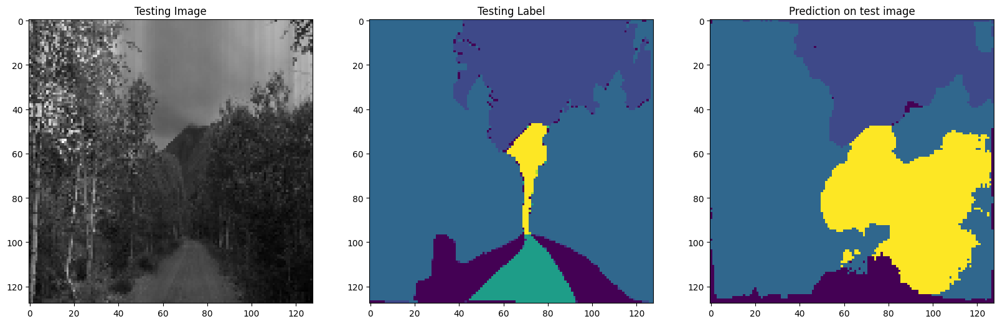

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 12]
Unique Classes in predicted taesting image  [0 1 2 3 6 9]


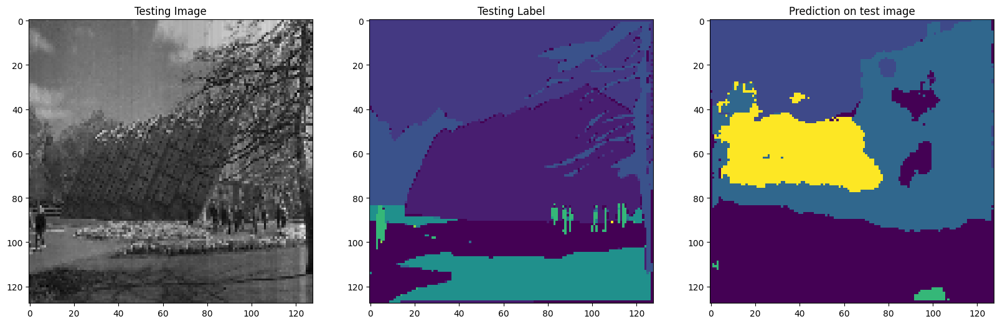

1/1 [==============================] - 0s 32ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 3 6]


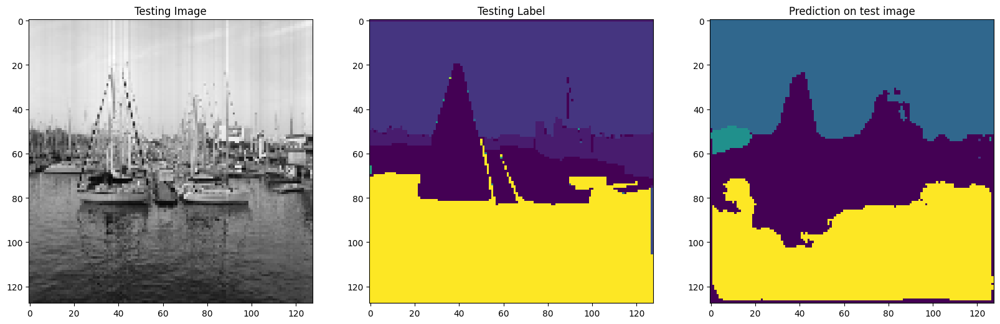

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 2 3]
Unique Classes in predicted taesting image  [0 2 3]


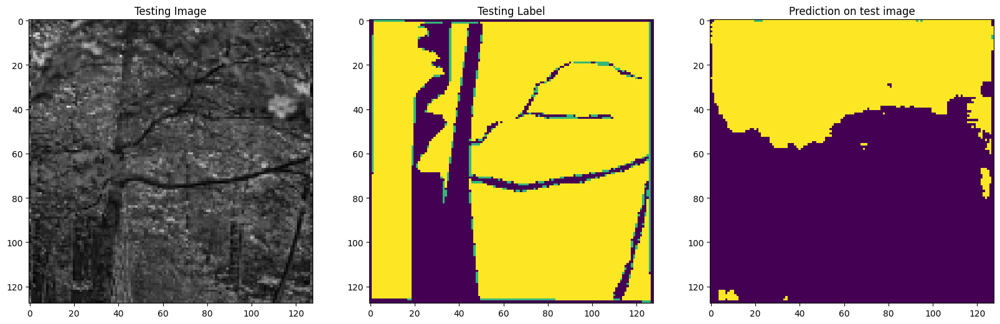

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 12]


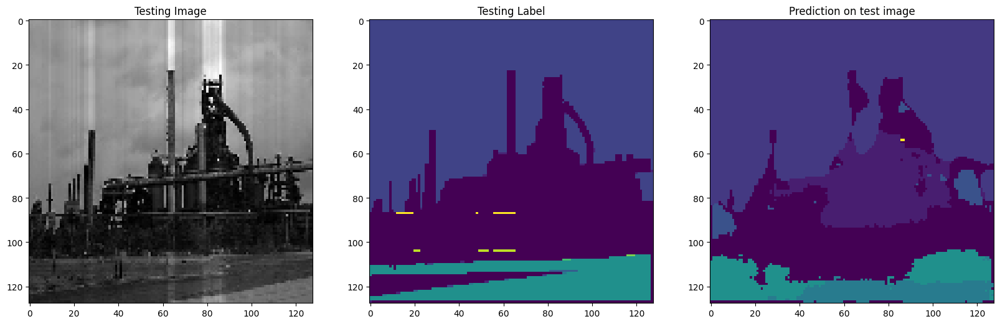

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8]
Unique Classes in predicted taesting image  [0 2 3 5 6 9]


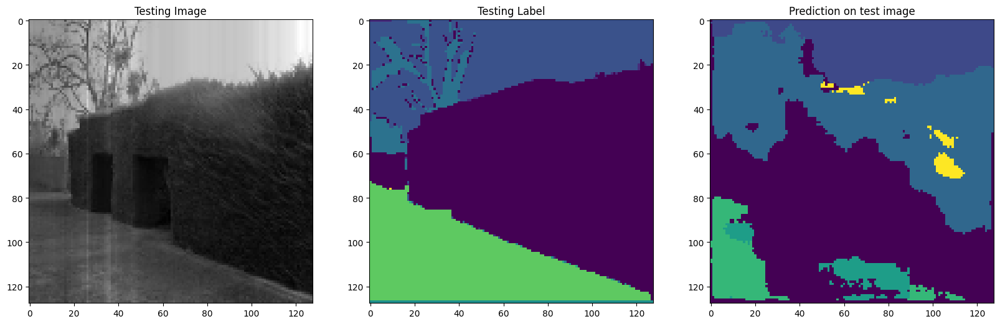

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 2 3]


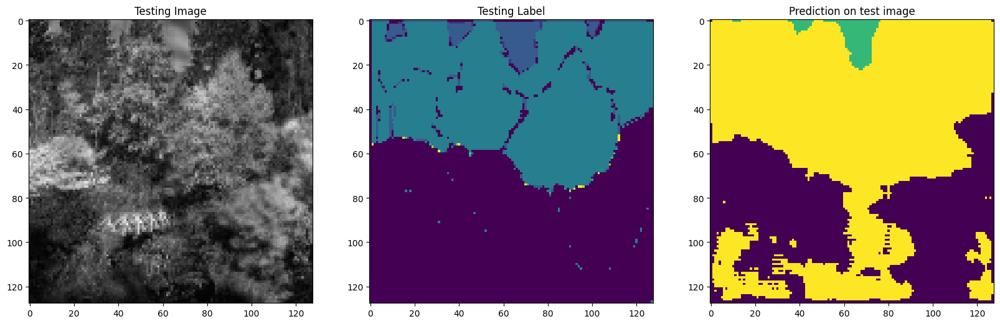

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


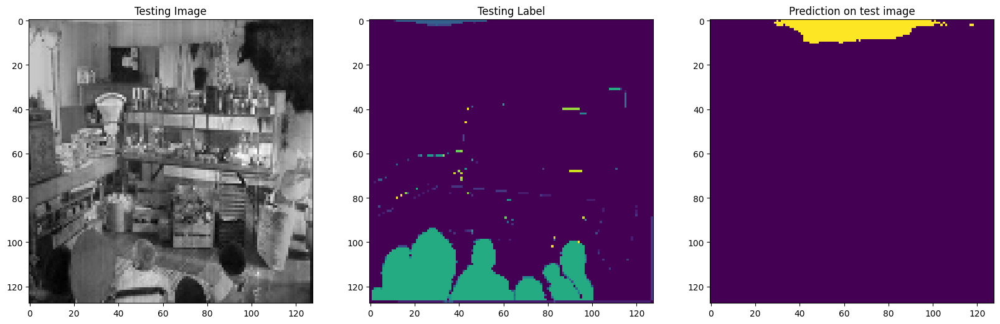

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 9]


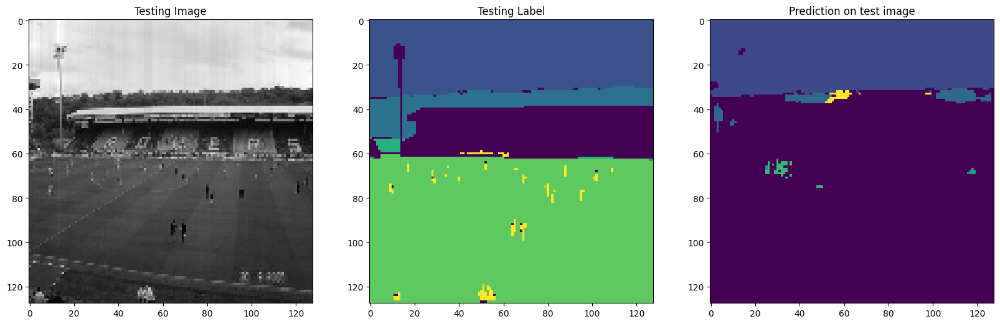

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6 11]
Unique Classes in predicted taesting image  [0 2 4]


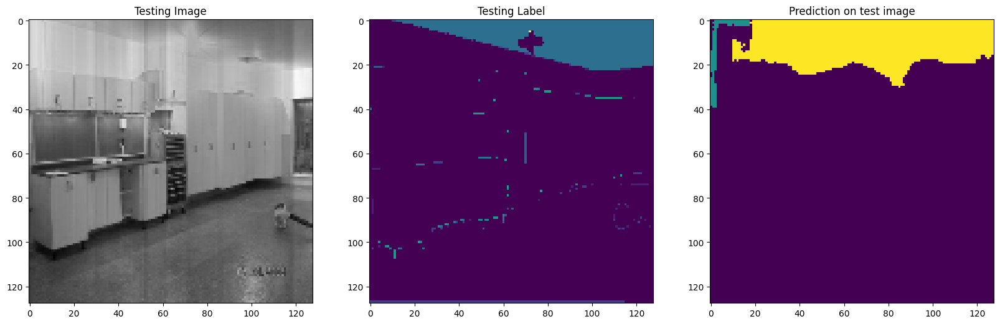

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 6]


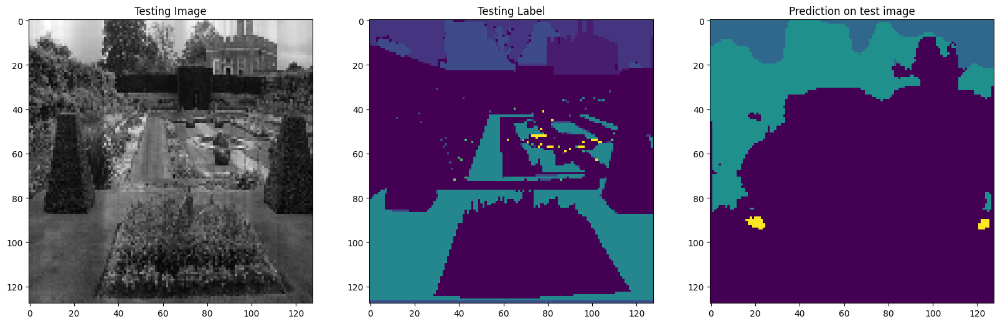

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12]
Unique Classes in predicted taesting image  [0 2 5 6]


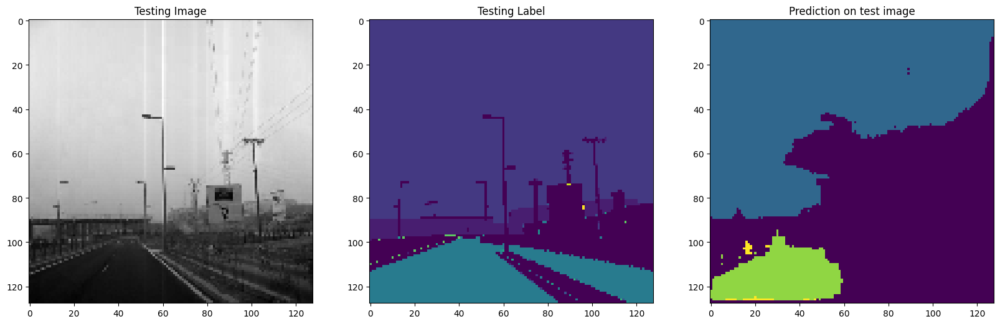

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 4]


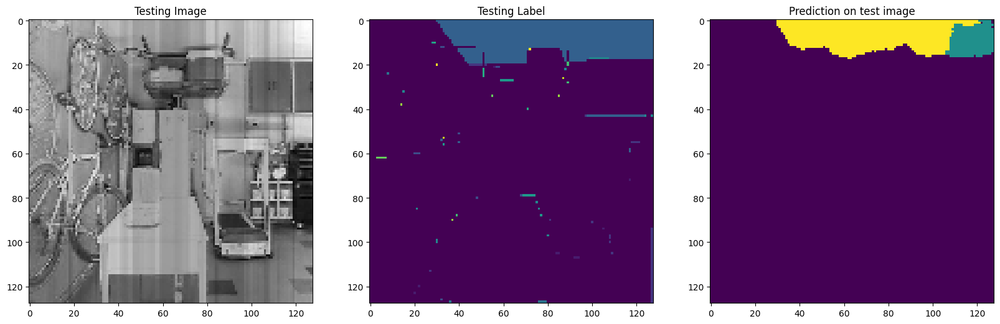

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 2 3 4 6]


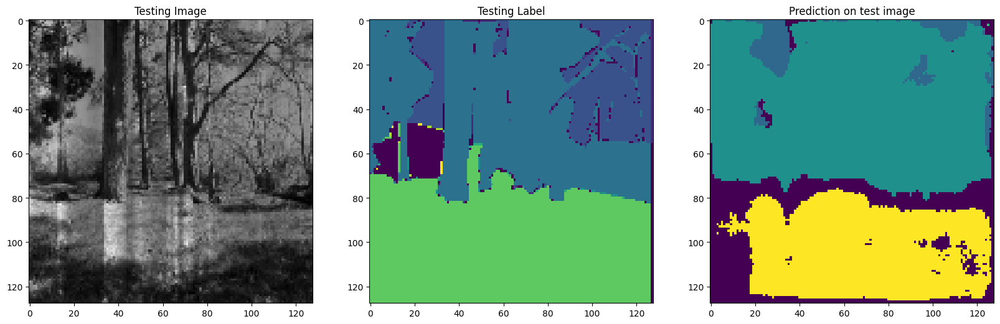

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8]
Unique Classes in predicted taesting image  [ 0  1  2  3  5 12]


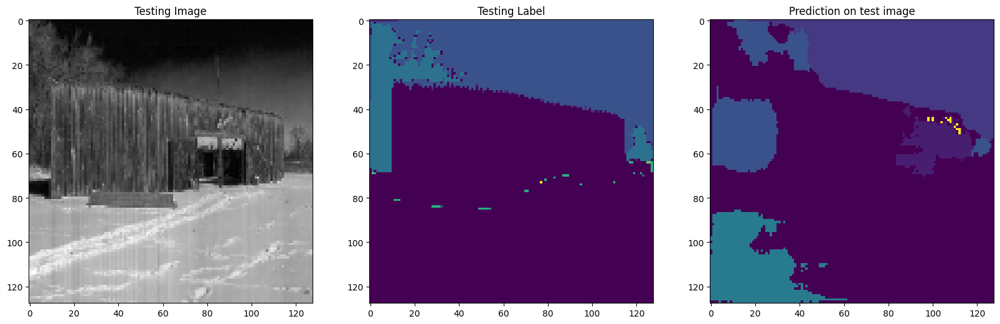

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 6 9]


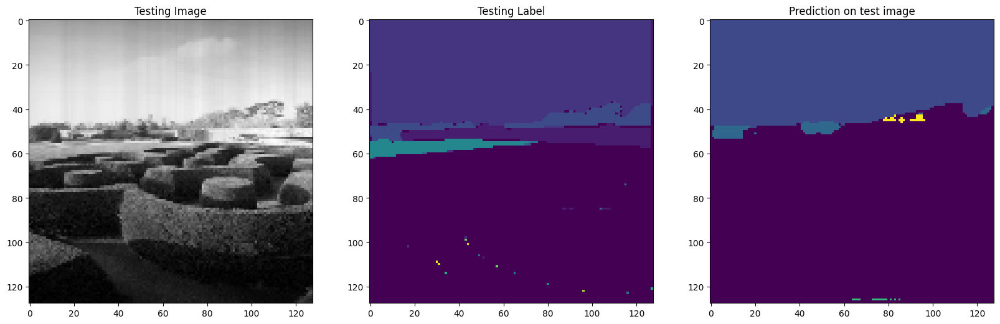

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5 10]
Unique Classes in predicted taesting image  [0 1 2 5]


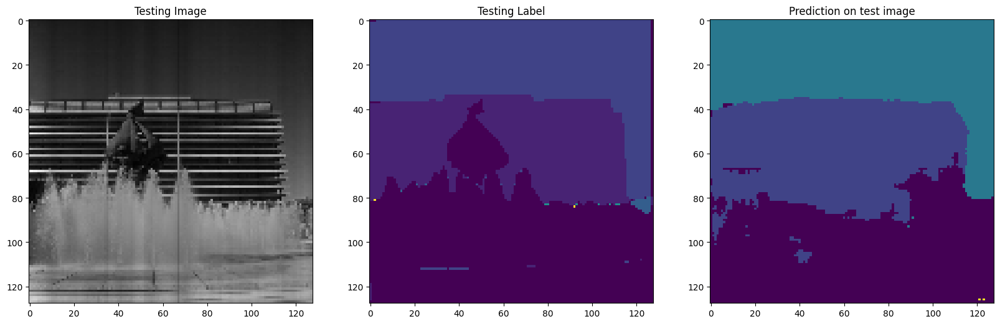

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  9 10]


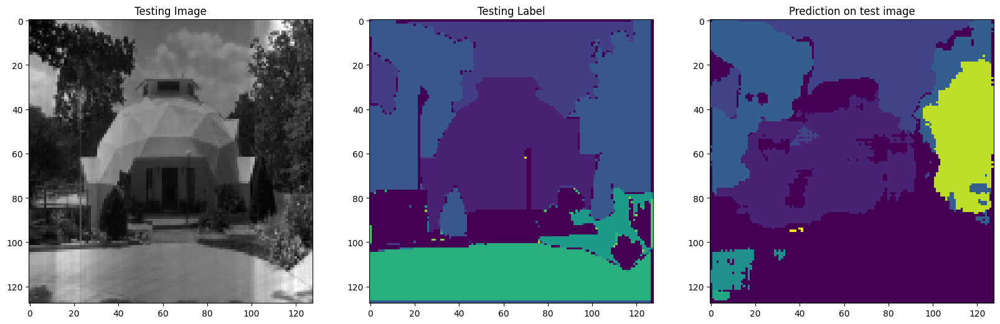

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  7  8 10 11 12]
Unique Classes in predicted taesting image  [0 2 3 4]


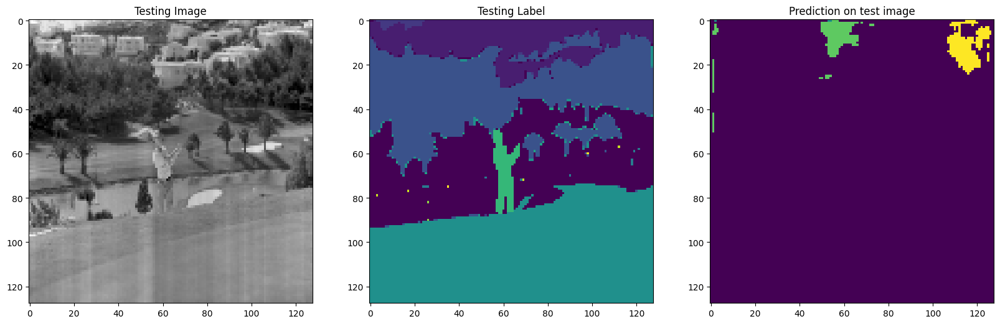

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  8 10 11 13]
Unique Classes in predicted taesting image  [0 1 2 4 5]


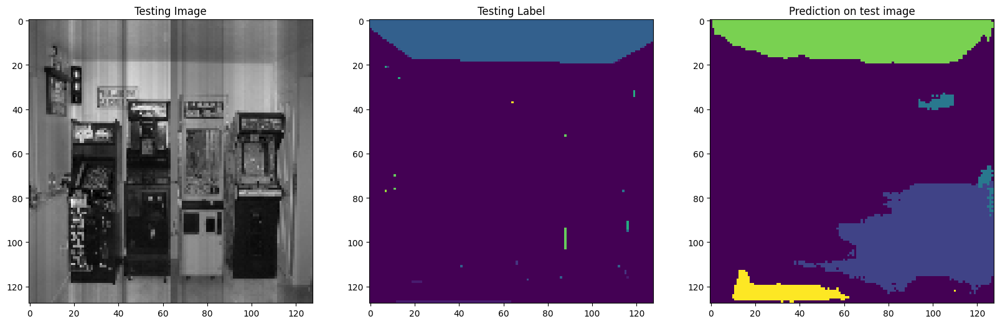

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  2  3  5  6  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 2 3 9]


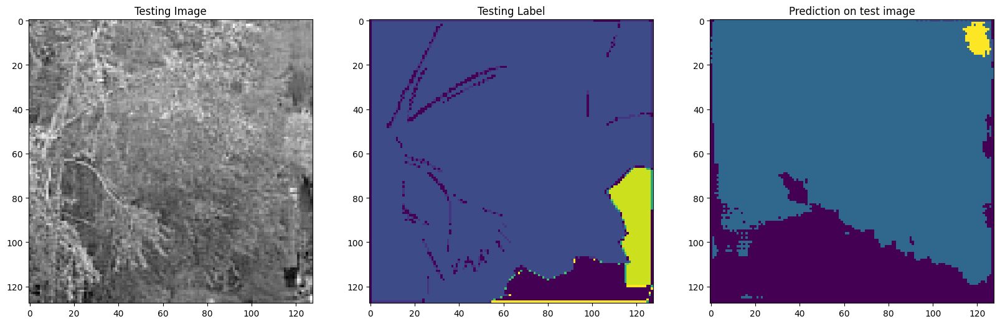

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 5 6 8 9]
Unique Classes in predicted taesting image  [0 2 3]


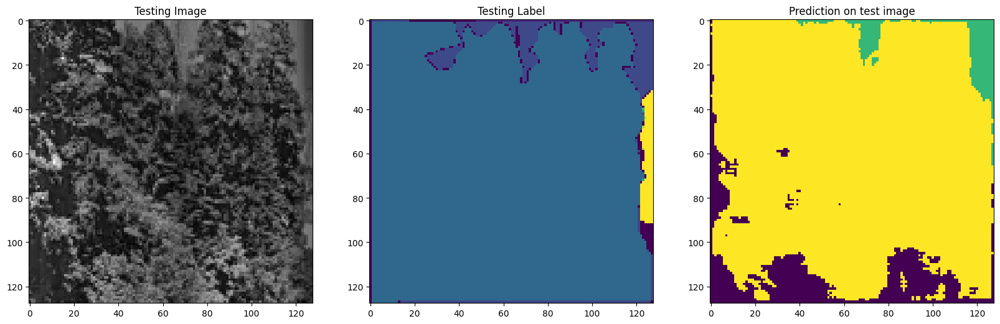

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  4  5  6 12]


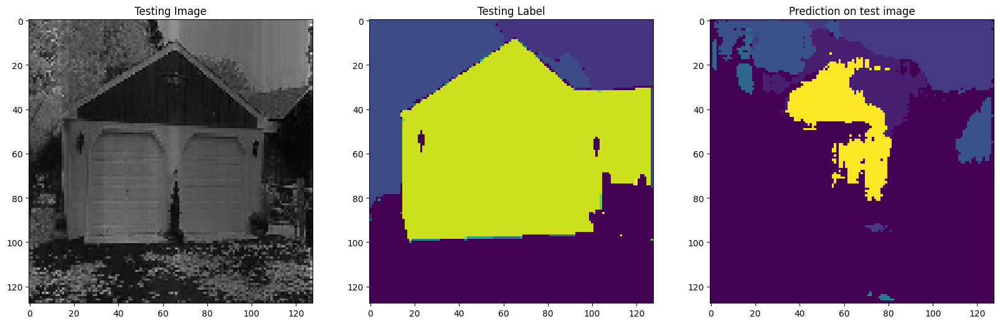

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 8 9]
Unique Classes in predicted taesting image  [0 2 3 5 6 9]


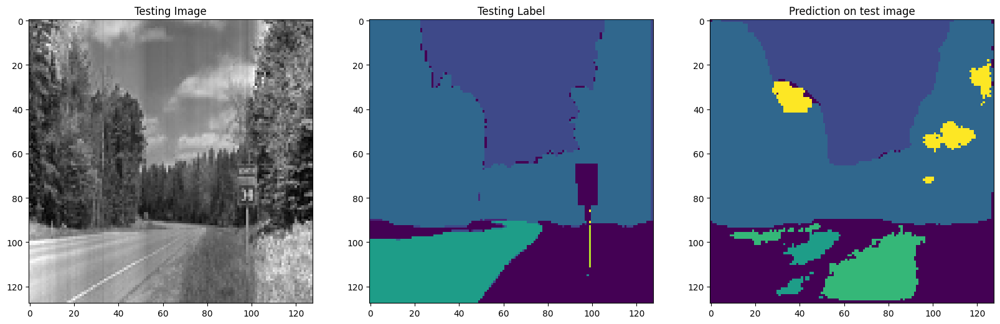

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 12 13]
Unique Classes in predicted taesting image  [0 4]


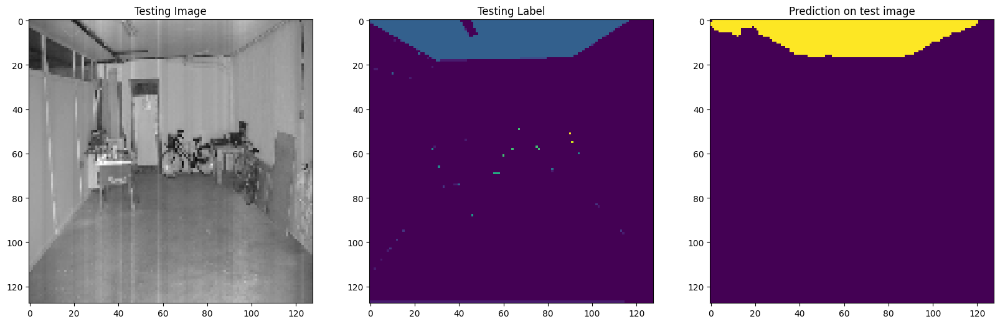

1/1 [==============================] - 0s 31ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3 12]


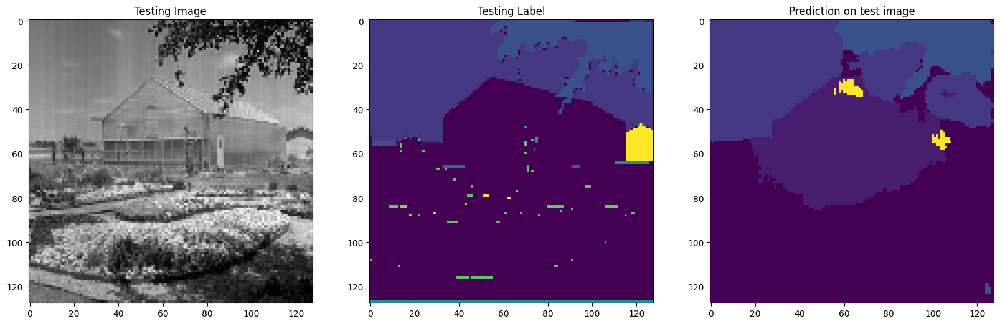

1/1 [==============================] - 0s 34ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


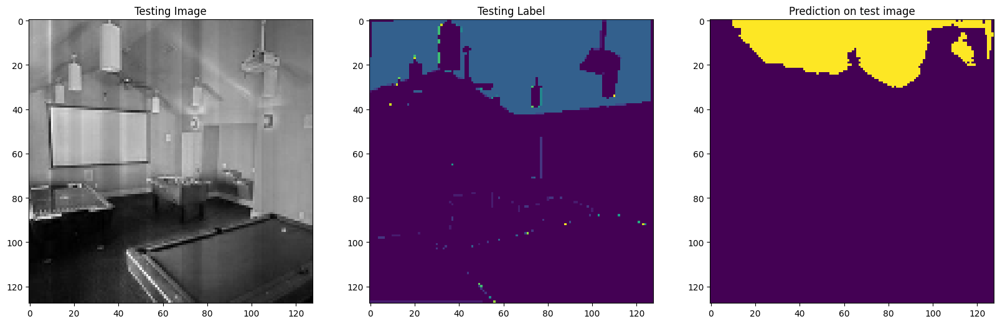

1/1 [==============================] - 0s 28ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6 12]


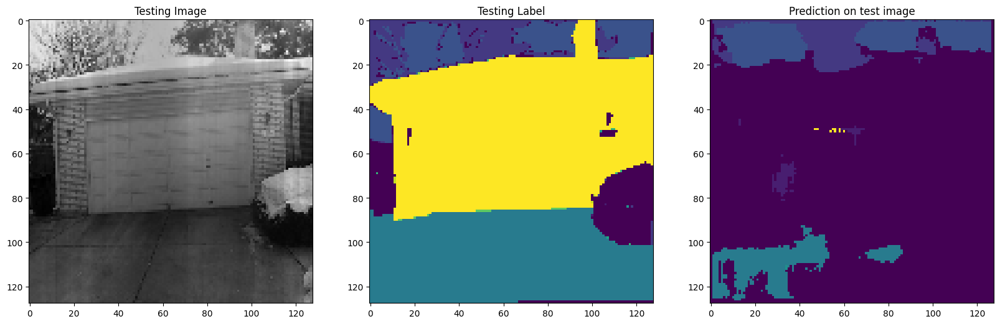

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8 9]
Unique Classes in predicted taesting image  [0 4]


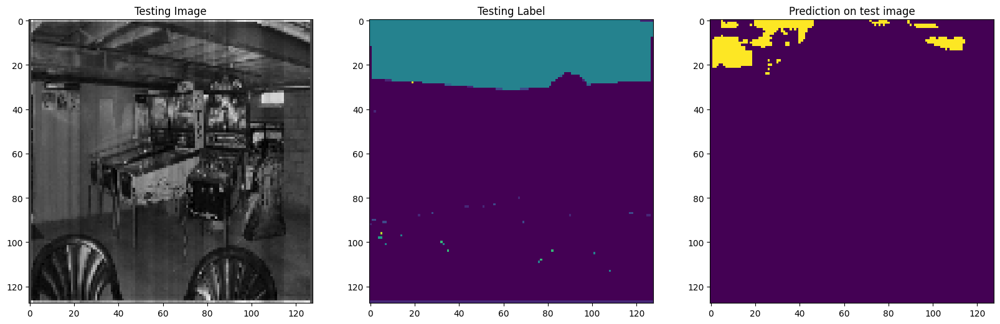

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 1 4]


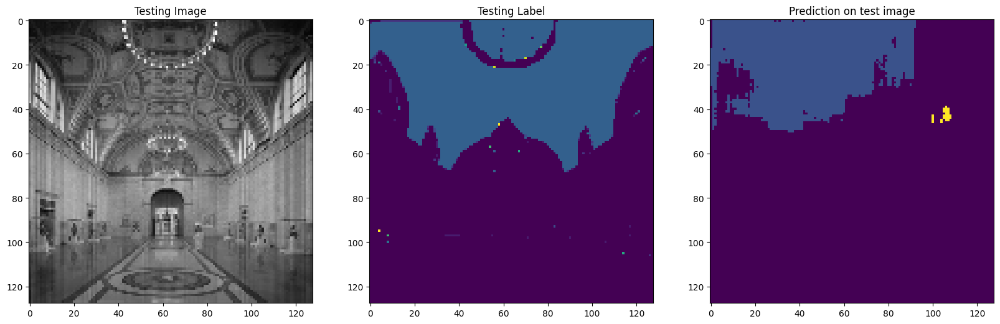

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


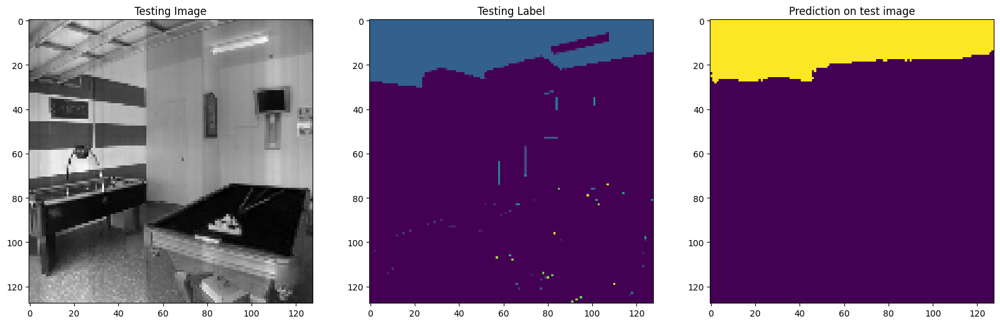

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 6]
Unique Classes in predicted taesting image  [0 2 3 6 9]


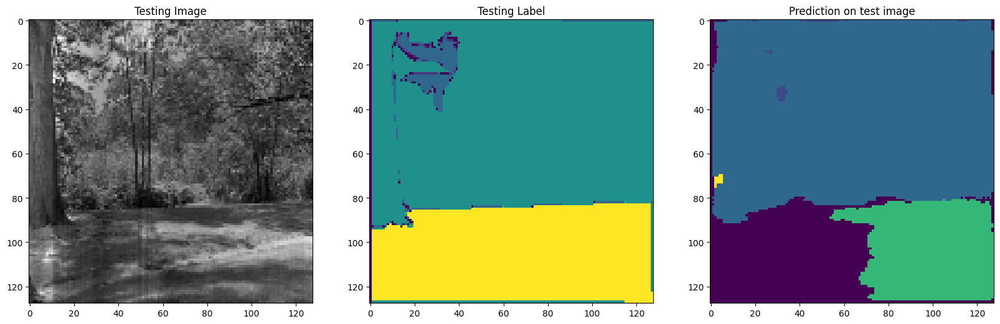

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11 12]
Unique Classes in predicted taesting image  [0 2 3 5 6]


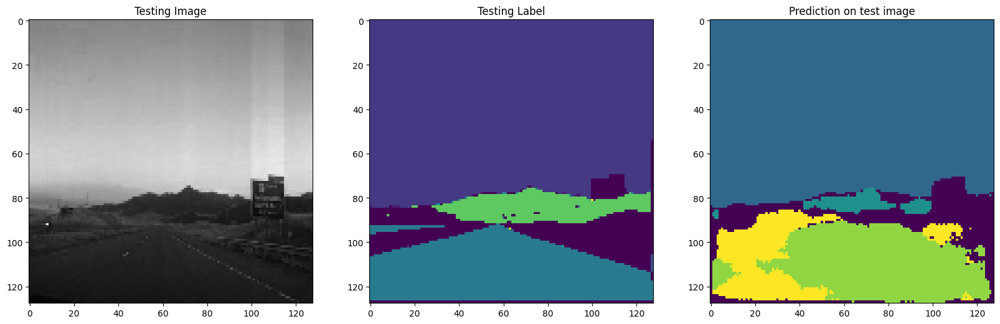

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 3 8]


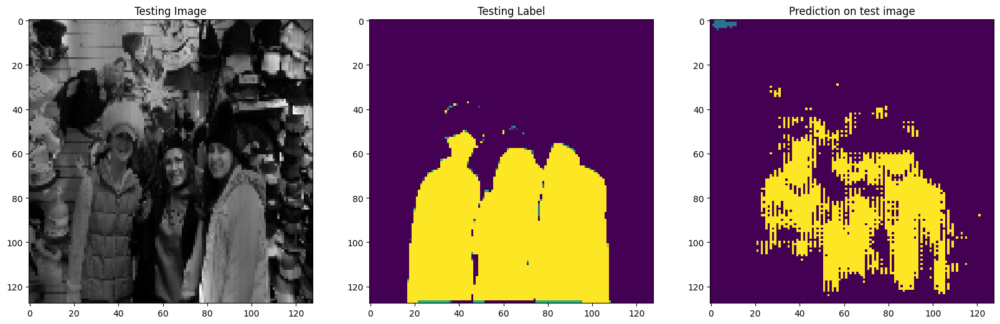

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 2 3]


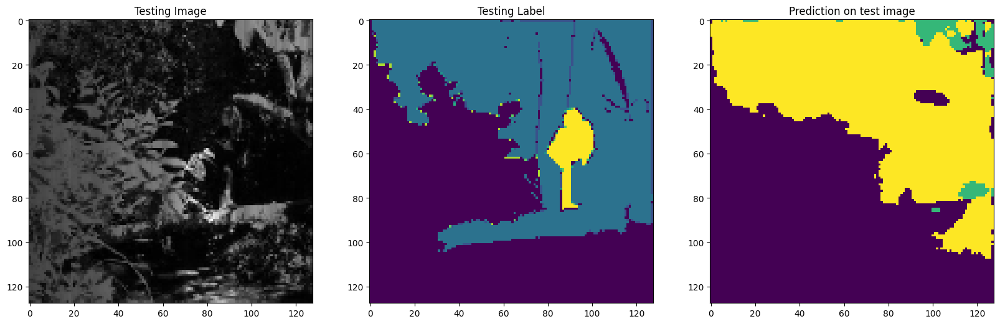

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3]
Unique Classes in predicted taesting image  [0 2 3]


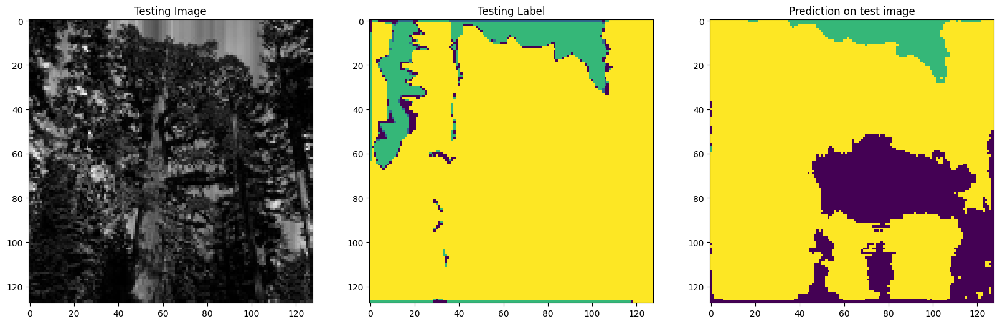

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  2  3  6  8 12]
Unique Classes in predicted taesting image  [0 2 3 6]


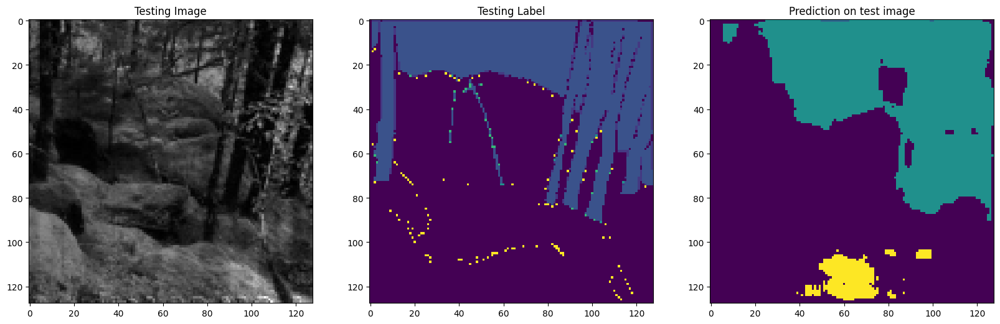

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  8  9 10 12 13]
Unique Classes in predicted taesting image  [0 3]


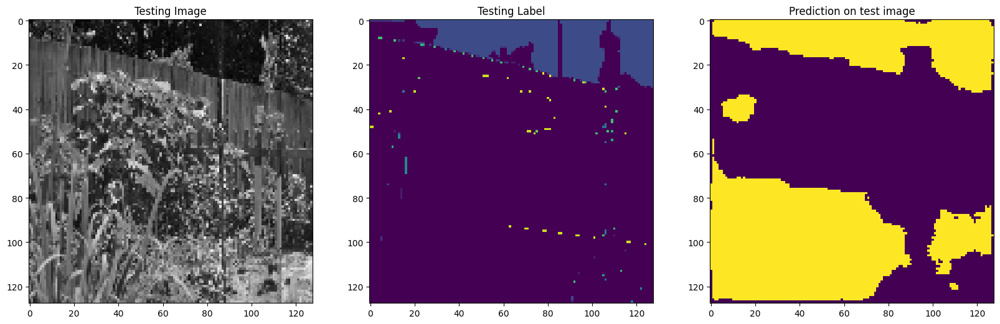

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5 12]
Unique Classes in predicted taesting image  [0 4 8]


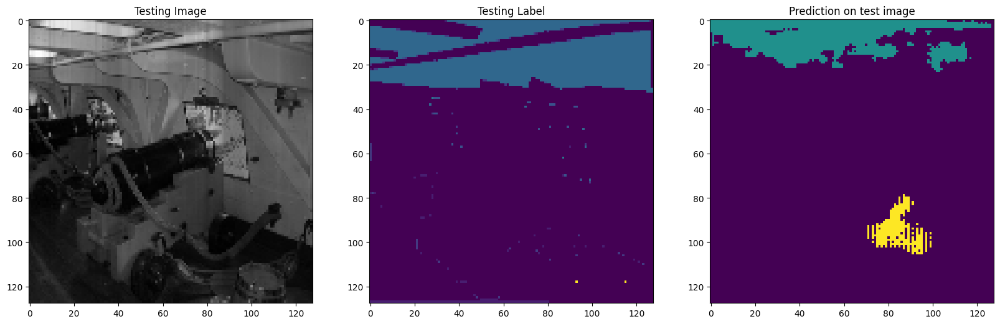

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  2  3 12]
Unique Classes in predicted taesting image  [0 2 3]


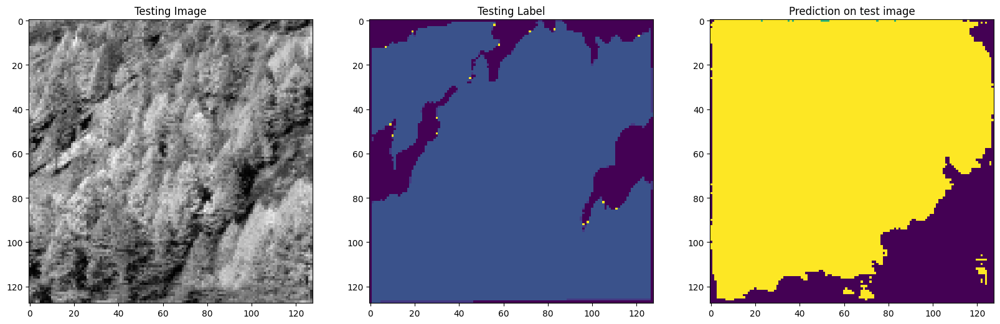

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 2 3 6]


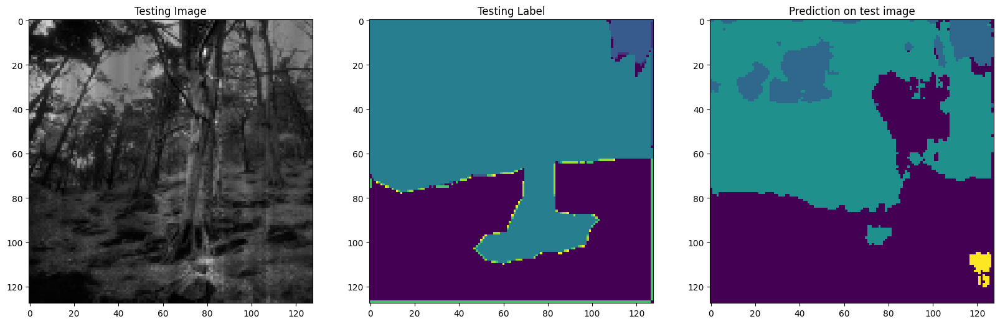

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5 12]


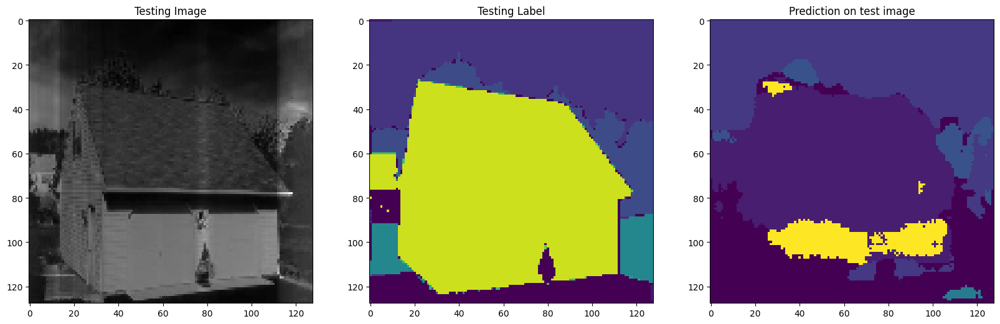

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 13]
Unique Classes in predicted taesting image  [0 2 4]


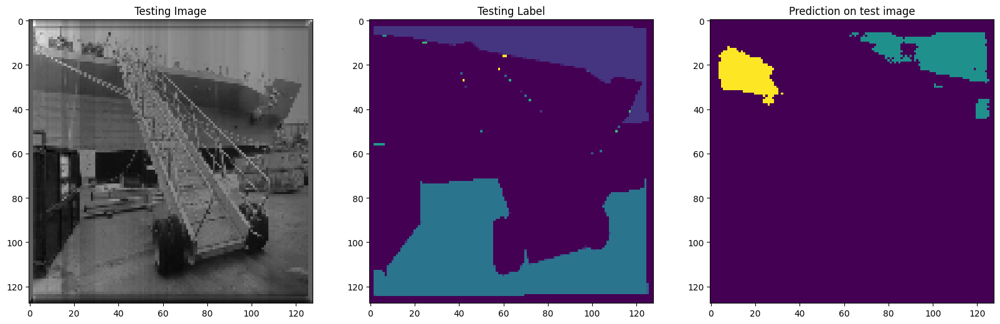

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 1 2 3 5]


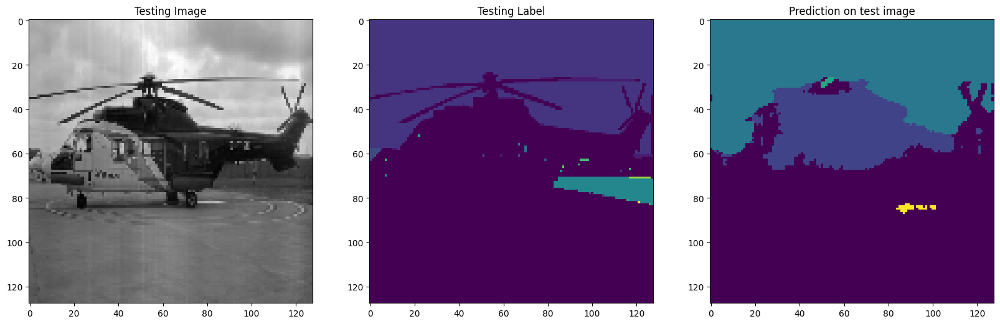

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  5 12]


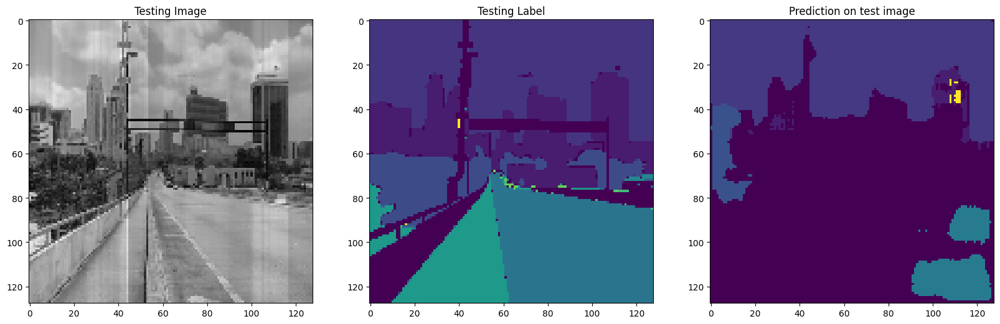

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8 11 12 13]
Unique Classes in predicted taesting image  [0 4]


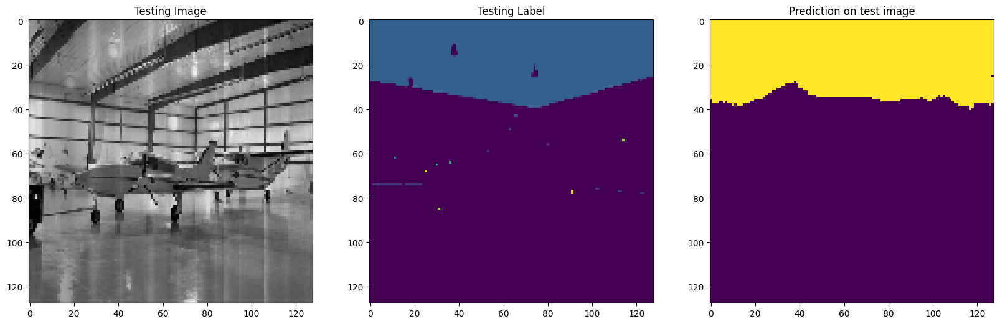

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3 5 6]


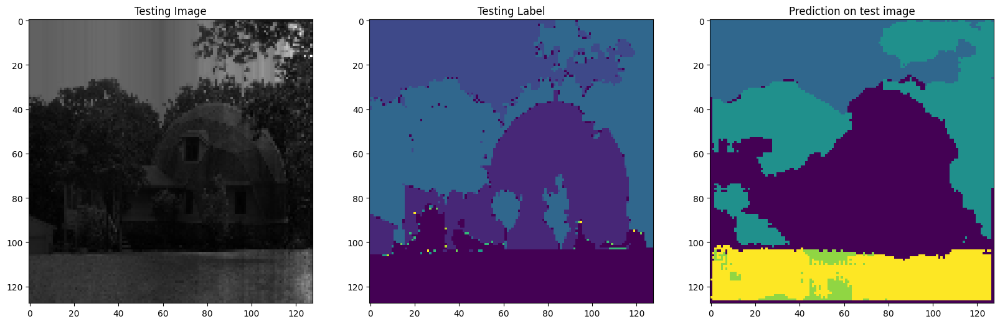

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 4]


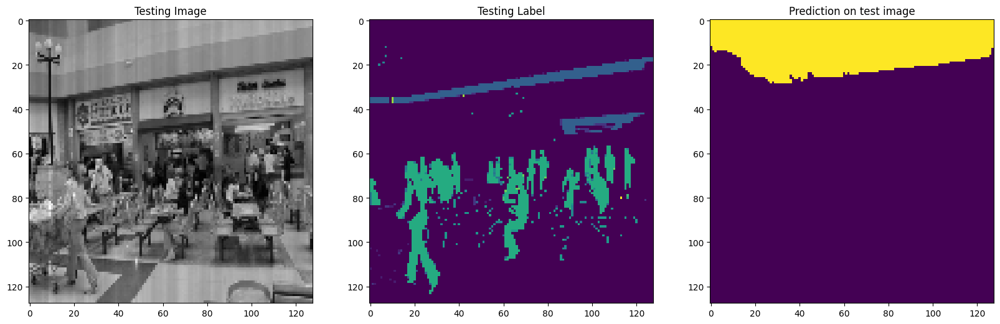

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2 3 5 6 9]


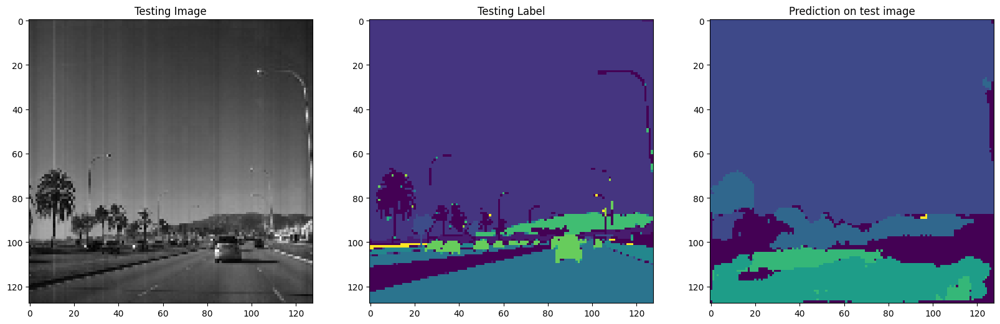

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 12 13]
Unique Classes in predicted taesting image  [0 2 4 5 6]


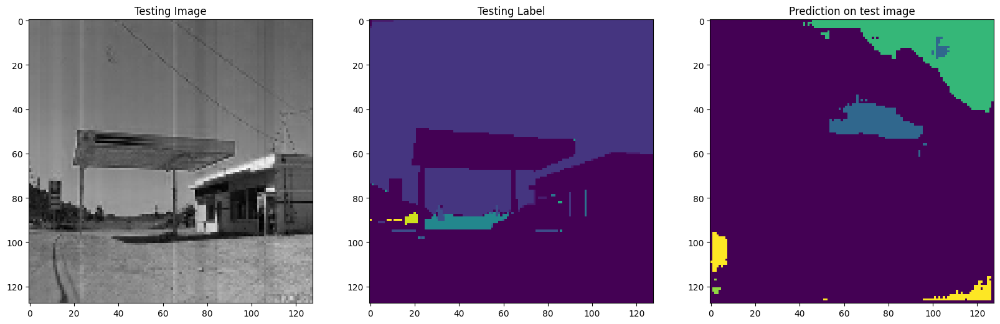

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


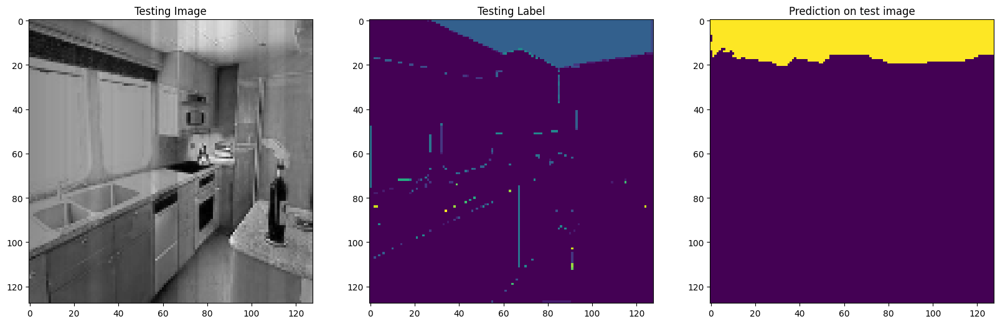

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  6  8  9 10 13]
Unique Classes in predicted taesting image  [0 2 3]


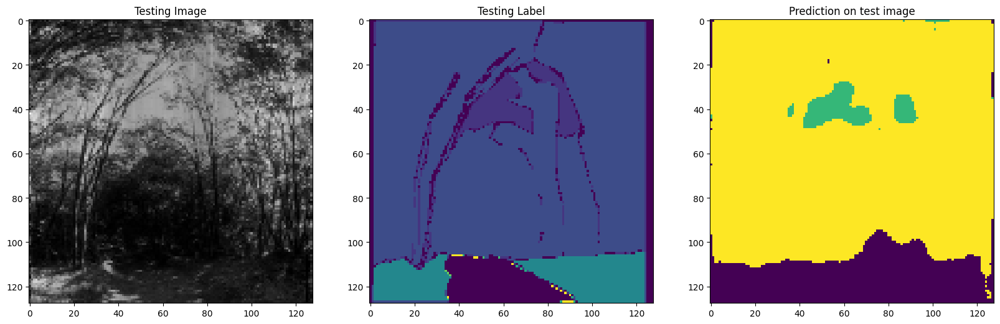

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


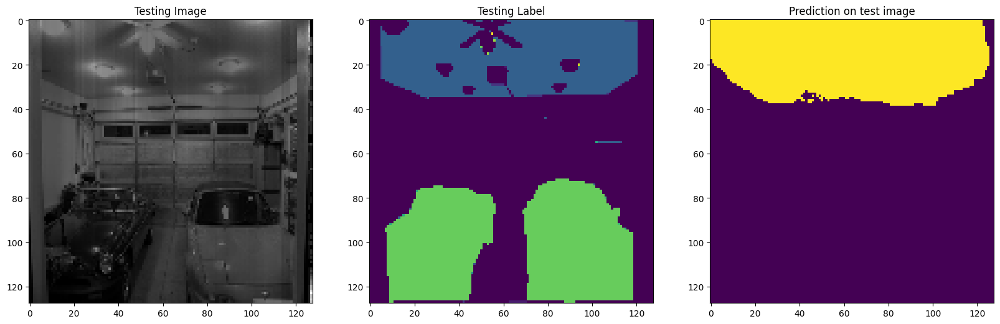

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 13]
Unique Classes in predicted taesting image  [0 2 5 6]


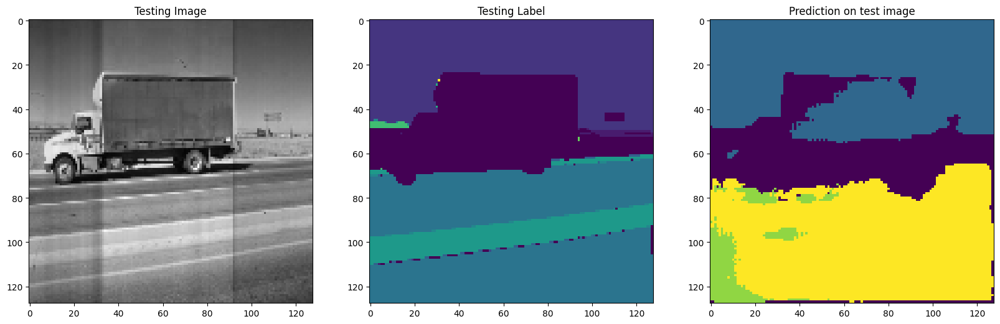

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 1 2 5]


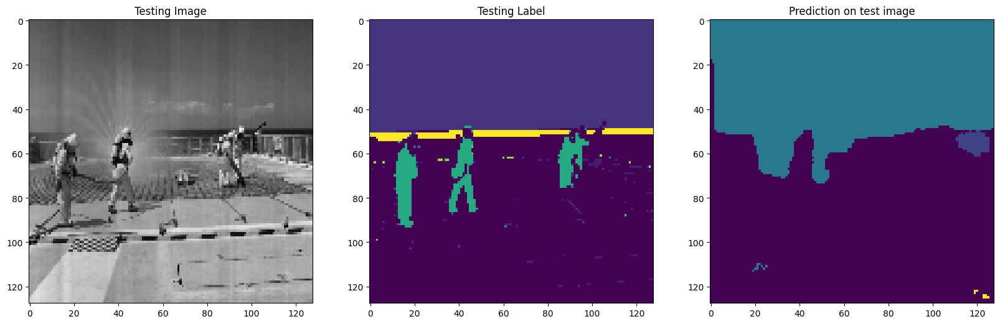

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8 10 12 13]
Unique Classes in predicted taesting image  [0 2 3 6]


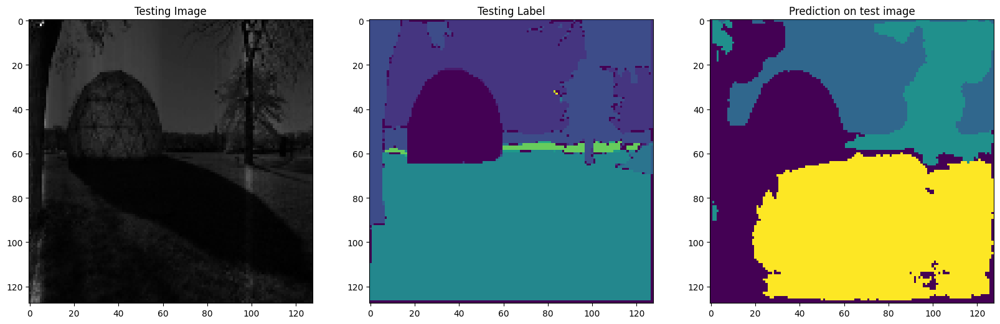

1/1 [==============================] - 0s 29ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [ 0  1  2  3  5 12]


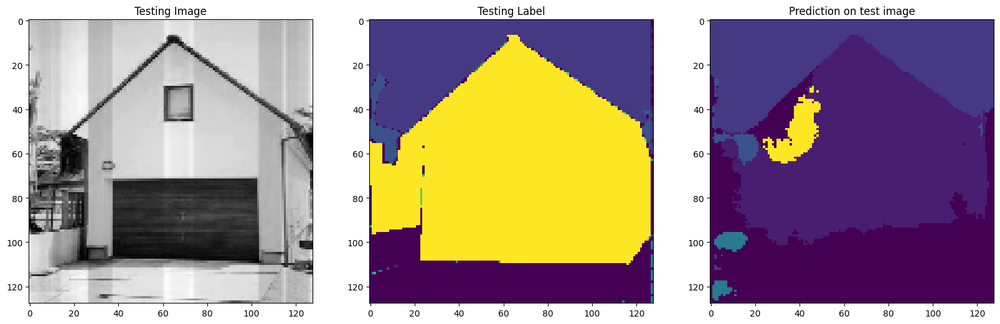

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  3  6 12]


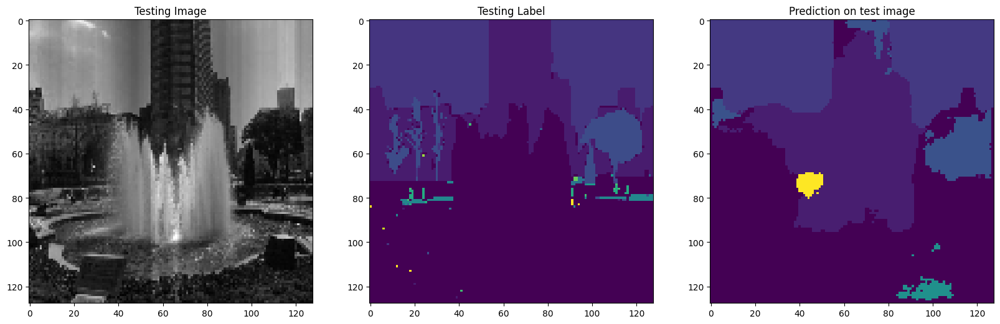

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 1 2 4 6 8]


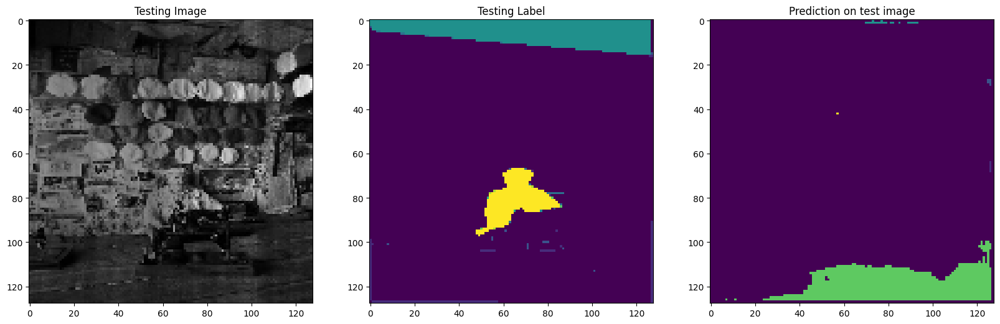

1/1 [==============================] - 0s 30ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 2 3 9]


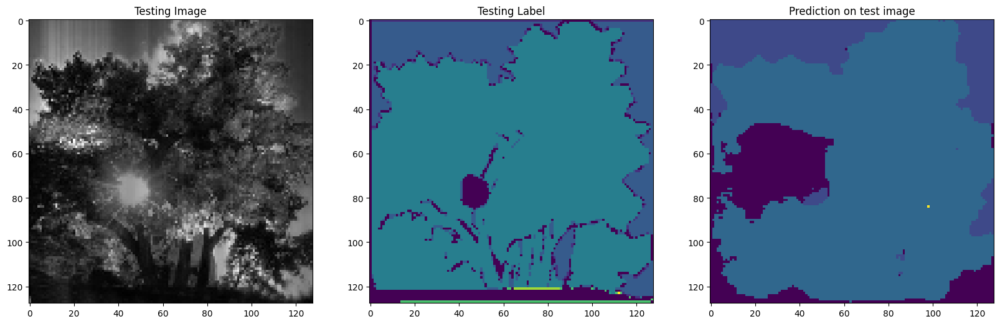

1/1 [==============================] - 0s 31ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8]
Unique Classes in predicted taesting image  [0 2 3 9]


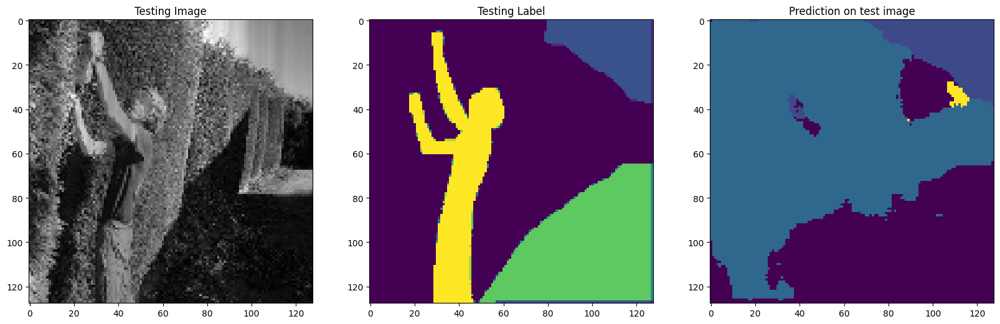

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3 5 6]


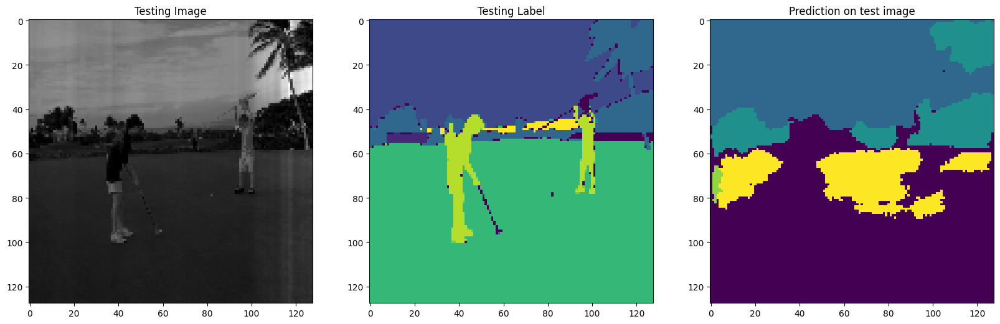

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3 6 9]


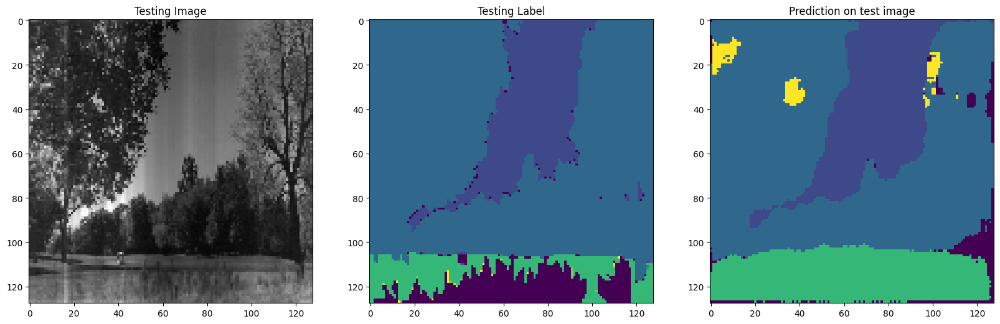

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3]


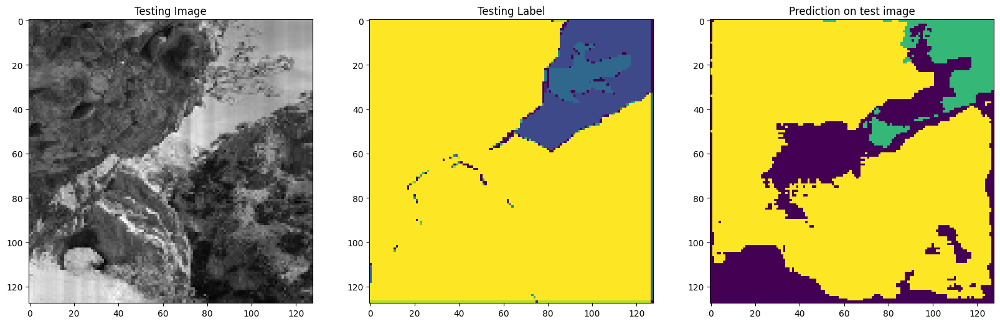

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 2 3 6]


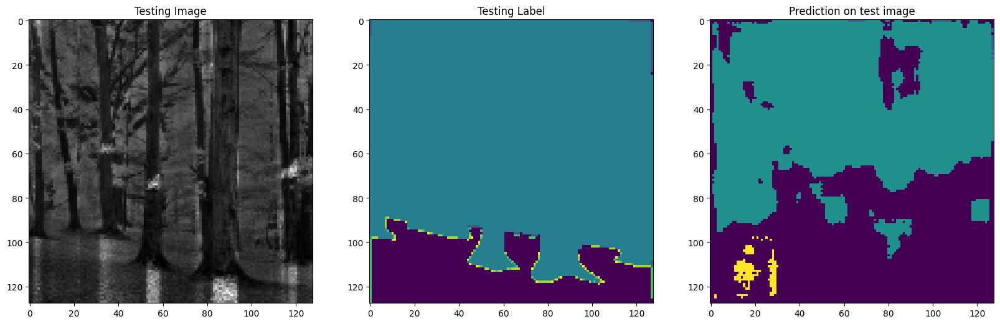

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 2 3 6 9]


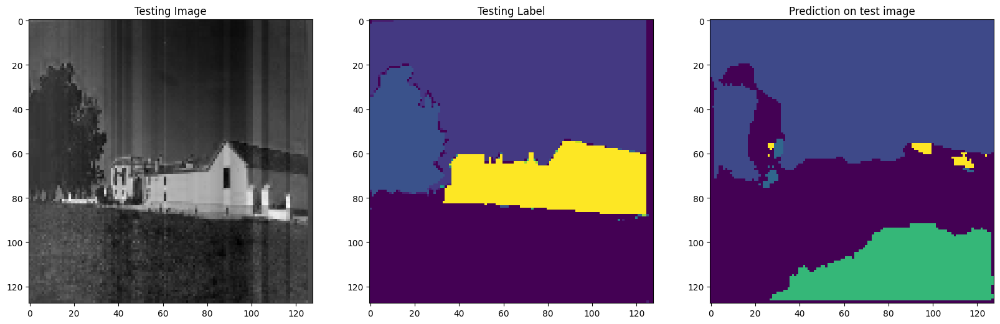

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 11]
Unique Classes in predicted taesting image  [0 1 2 3 5 6]


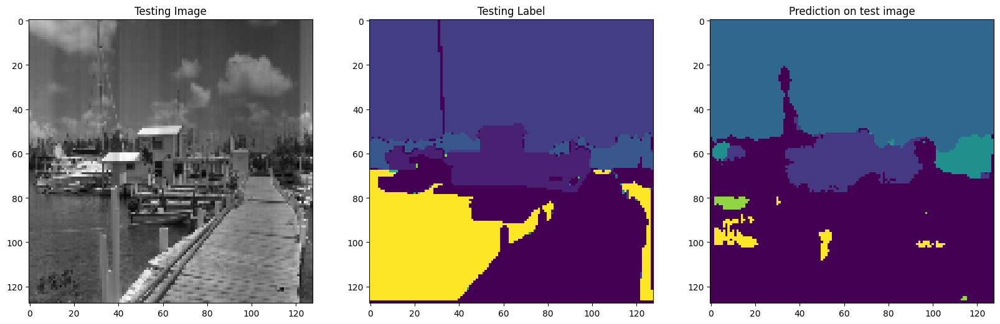

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  9 10 11 12 13]
Unique Classes in predicted taesting image  [ 0  1  2  6 12]


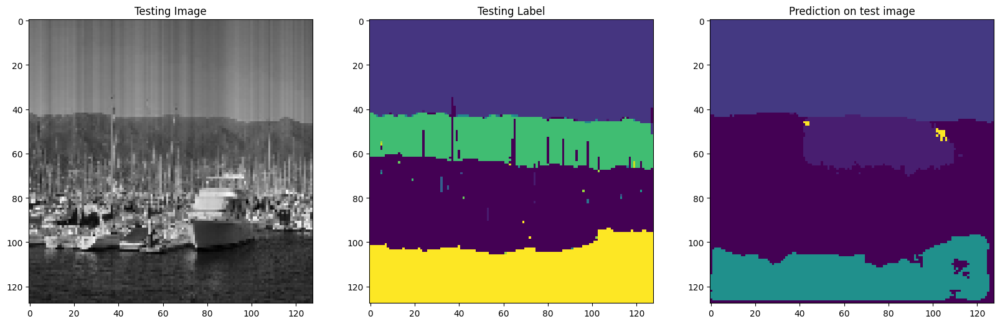

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 5 9]


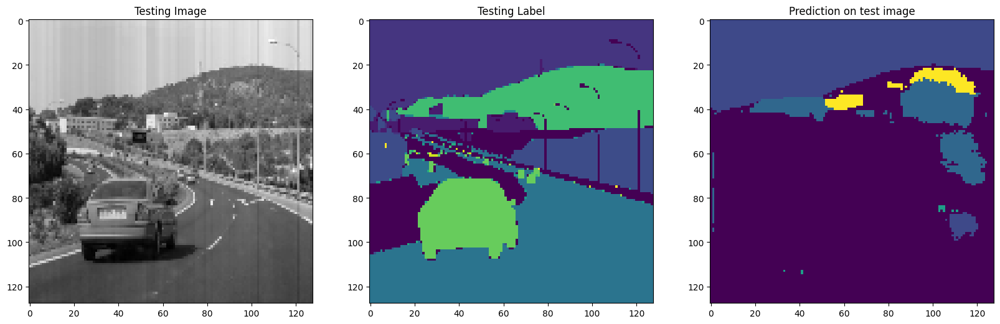

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 8]
Unique Classes in predicted taesting image  [0 3 4 8]


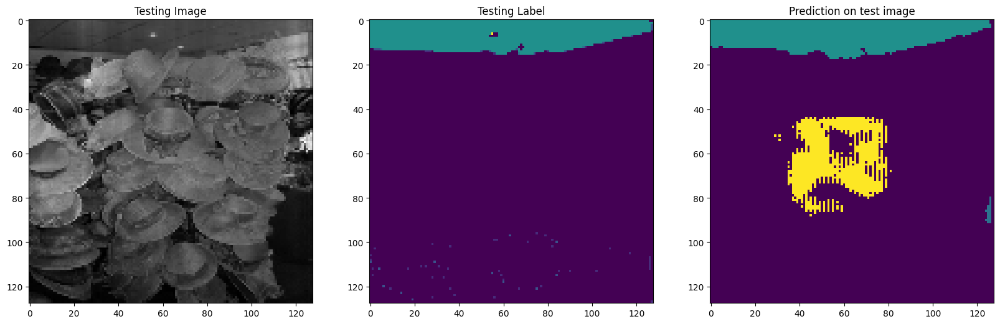

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 12]
Unique Classes in predicted taesting image  [0 1 2 3 5 6 9]


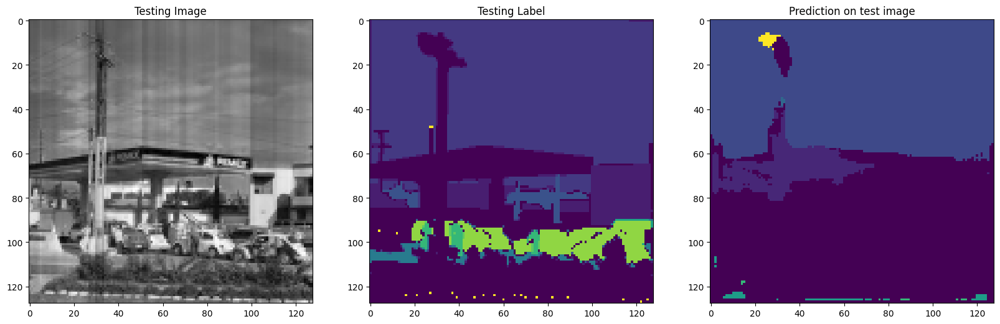

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11]
Unique Classes in predicted taesting image  [0 4]


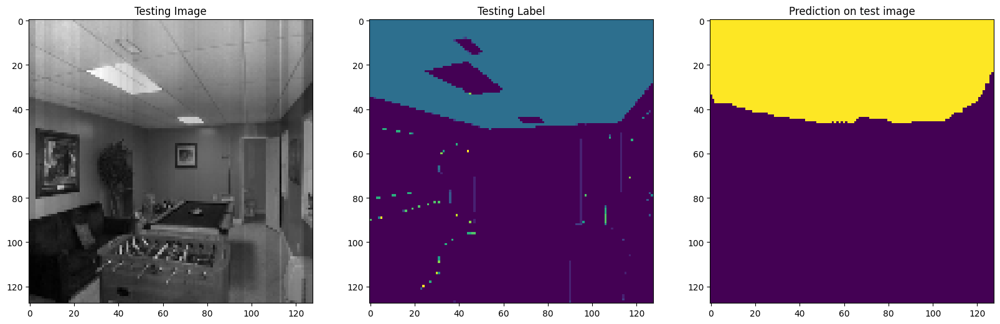

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 12 13]
Unique Classes in predicted taesting image  [0 4]


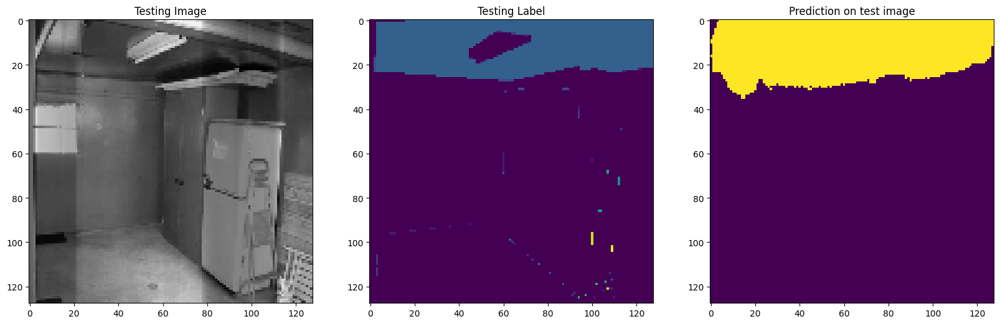

1/1 [==============================] - 0s 27ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  9 11]
Unique Classes in predicted taesting image  [ 0  1  2  4  5  8 12]


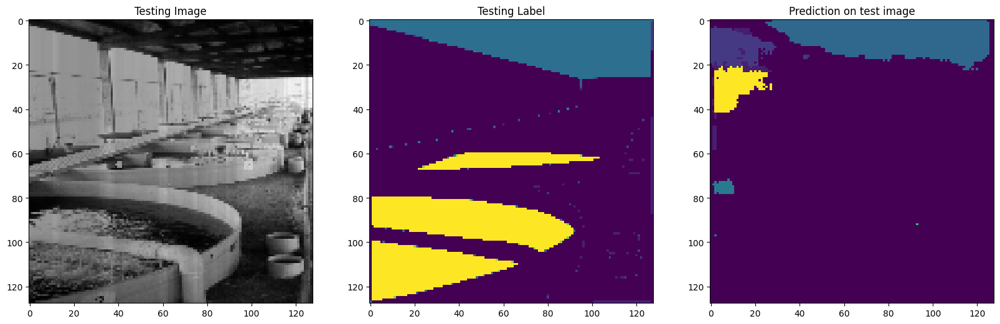

1/1 [==============================] - 0s 26ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7]
Unique Classes in predicted taesting image  [0 2 3]


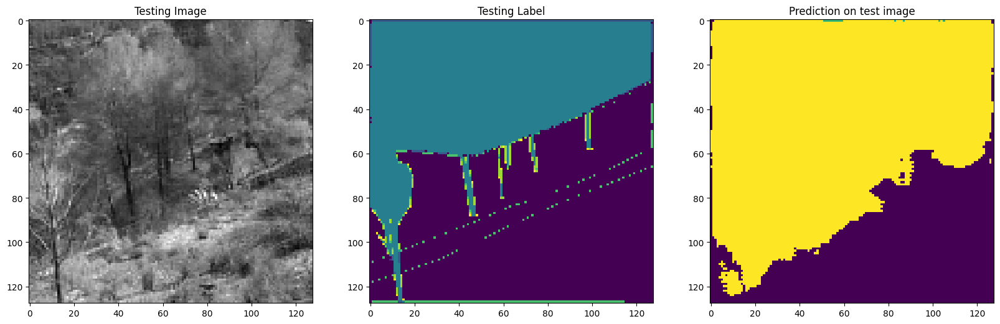

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 8]
Unique Classes in predicted taesting image  [ 0  1  2  3  5  6  9 12]


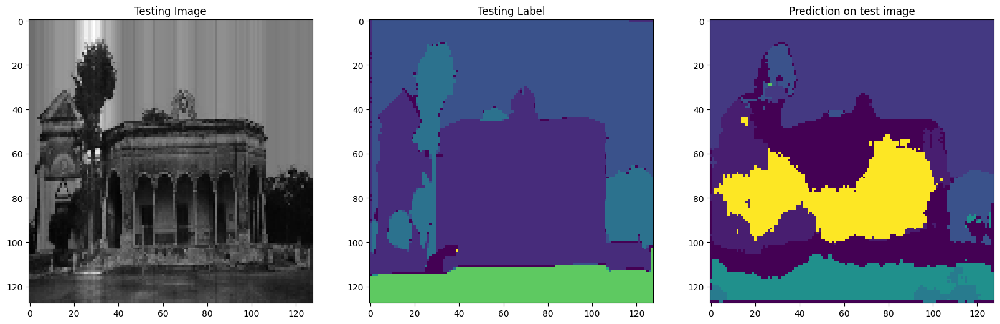

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6]
Unique Classes in predicted taesting image  [0 2 3 6 9]


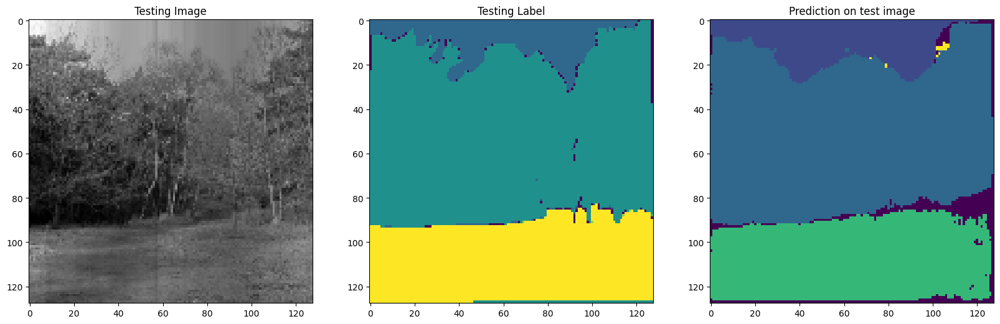

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  7  8  9 10 11 12]
Unique Classes in predicted taesting image  [0 4]


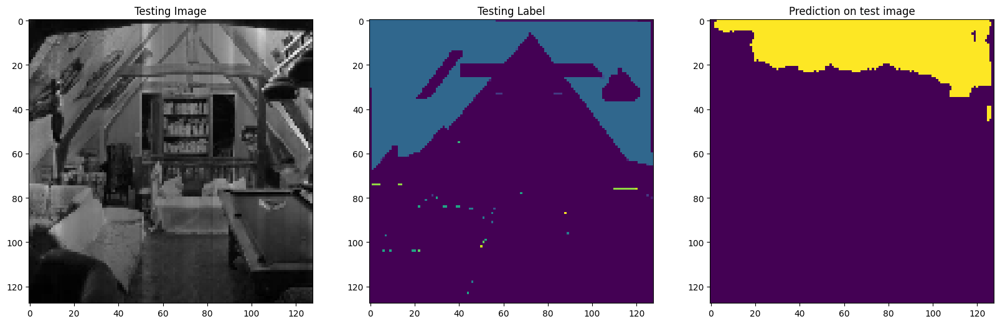

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 1 3 4]


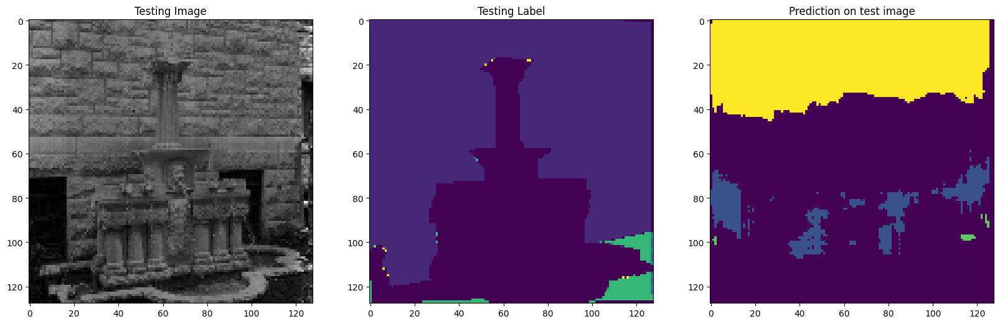

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [0 1 2 3 4 5 6 7 8 9]
Unique Classes in predicted taesting image  [0 2 3 5 9]


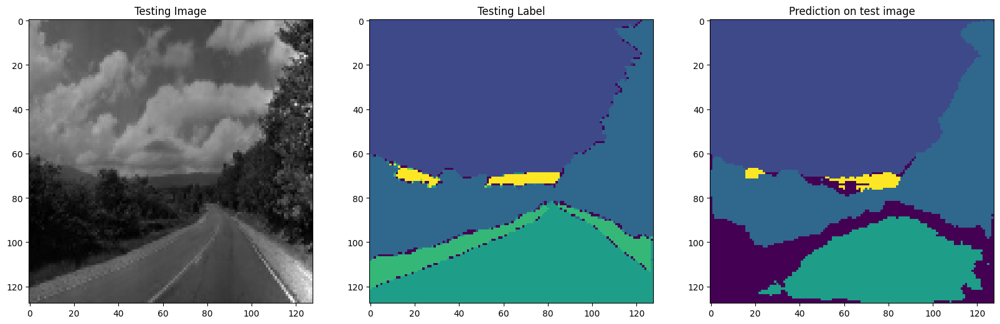

1/1 [==============================] - 0s 25ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 13]
Unique Classes in predicted taesting image  [0 2 3 5 6]


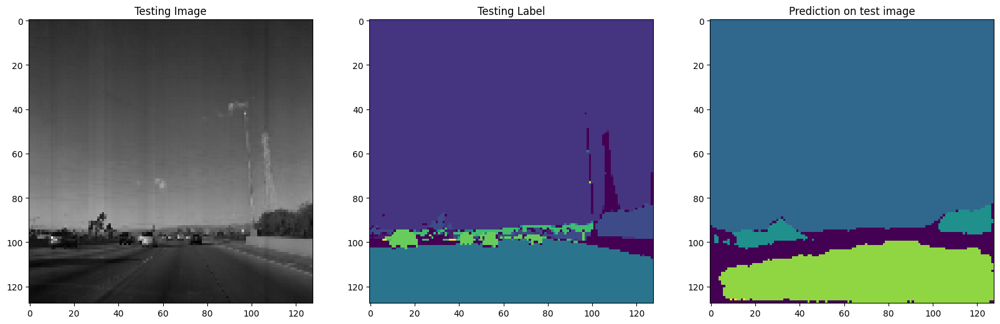

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  6  7  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 2 3 5 6]


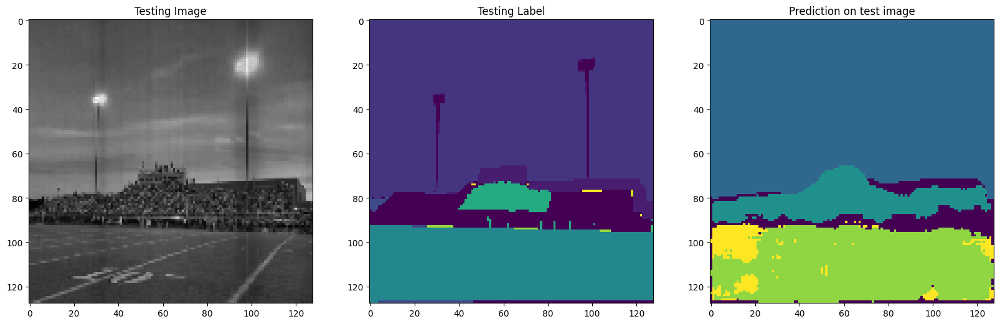

1/1 [==============================] - 0s 23ms/step
Unique Classes in Testing Image  [ 0  1  2  3  6  8  9 11 12 13]
Unique Classes in predicted taesting image  [0 1 2 4]


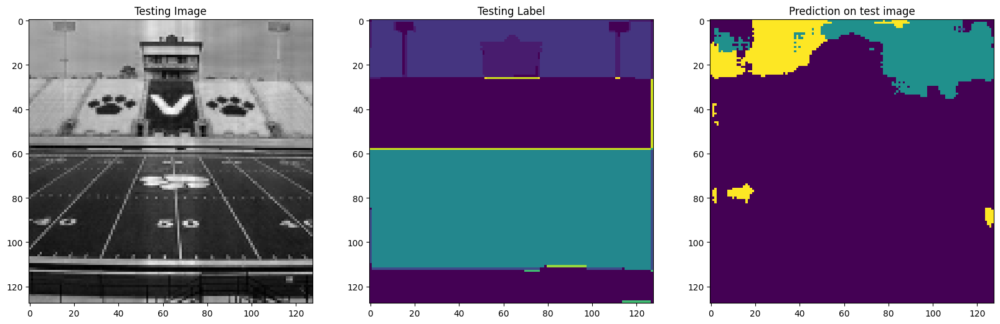

1/1 [==============================] - 0s 24ms/step
Unique Classes in Testing Image  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Unique Classes in predicted taesting image  [0 4]


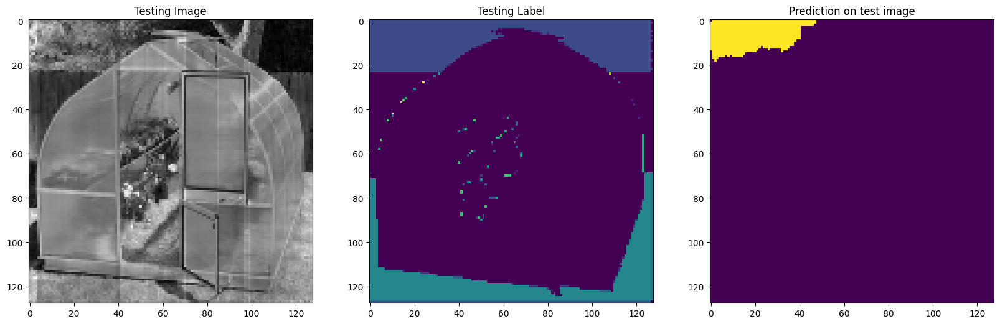

In [542]:
#Generating masks for all the test data set
for test_img_number in range(X_test.shape[0]):
  test_img = X_test[test_img_number]
  ground_truth=y_test[test_img_number]
  test_img_norm=test_img[:,:,0][:,:,None]
  test_img_input=np.expand_dims(test_img_norm, 0)
  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  print("Unique Classes in Testing Image ",np.unique(ground_truth[:,:,0]))
  print("Unique Classes in predicted taesting image ",np.unique(predicted_img))
    
  plt.figure(figsize=(20, 20))
  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_img[:,:,0], cmap='gray')
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(ground_truth[:,:,0])
  
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(predicted_img, )
    
 
  plt.show()




In [543]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 26ms/step


[0 2 3 5 6]
[0 1 2 3 4 5 6 7 8 9]


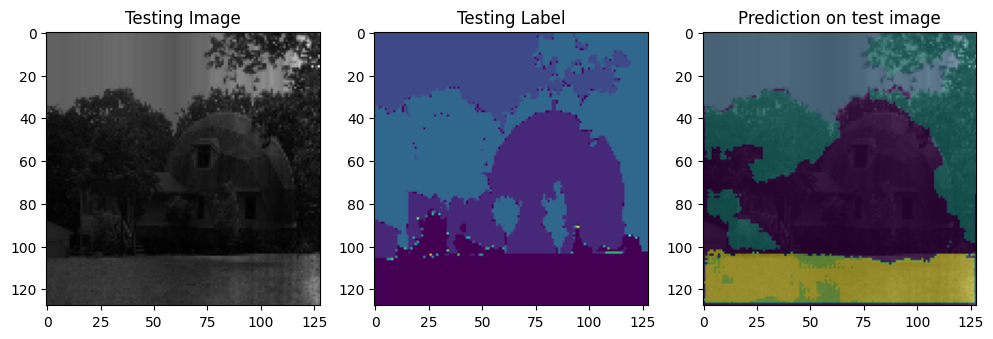

In [544]:
print(np.unique(predicted_img))
print(np.unique(ground_truth[:,:,0]))
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], )
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.imshow(predicted_img,alpha=0.5)
plt.show()


In [546]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


1/1 [==============================] - 0s 54ms/step


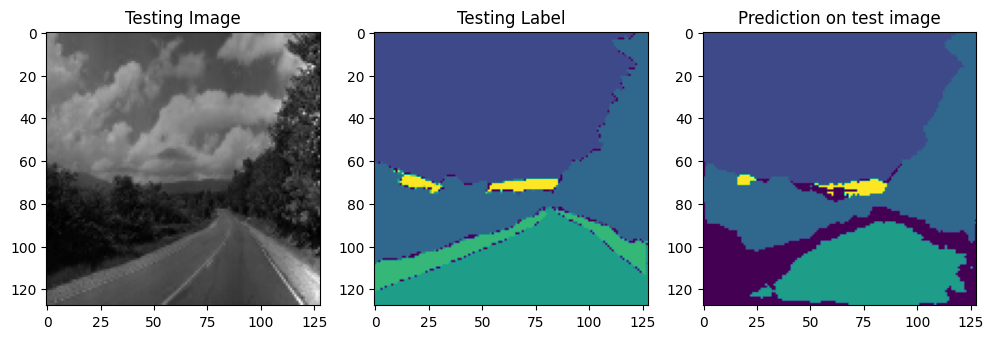

In [547]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img)
plt.show()


In [548]:
#Predict on a few images
#model = get_model()
#model.load_weights('/kaggle/input/unet/tensorflow2/unet1/1/UNET_test_acc0.94_val0.73.hdf5')
import random
test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]



1/1 [==============================] - 0s 27ms/step


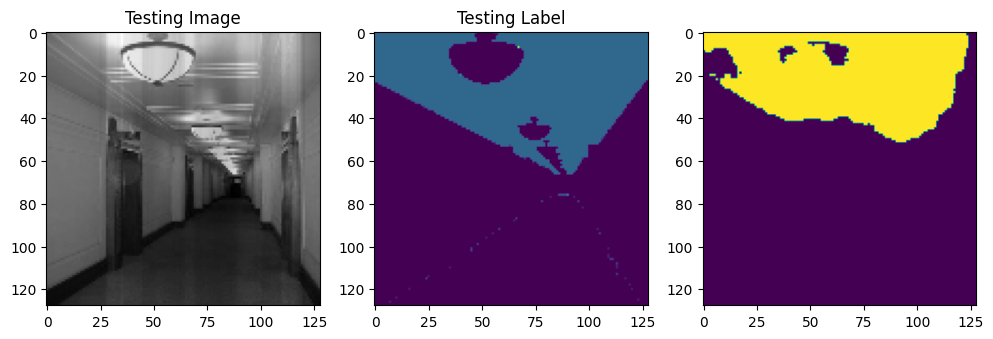

In [461]:
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')

plt.imshow(ground_truth[:,:,0])
plt.subplot(233)

plt.imshow(predicted_img)
plt.show()


In [133]:
before = [ 0 , 2,  3 , 5 , 6 , 7 ,10, 12 ,13, 17, 21, 22, 26 ,27]
after = [ 0 , 1 , 2 , 3,  4 , 5 , 6,  7 , 8,  9, 10, 11, 12, 13]

In [332]:
class_encoding = {}
for i in range(len(after)):
    class_encoding[after[i]] = before[i]

In [135]:
class_encoding={0: 0,
 1: 2,
 2: 3,
 3: 5,
 4: 6,
 5: 7,
 6: 10,
 7: 12,
 8: 13,
 9: 17,
 10: 21,
 11: 22,
 12: 26,
 13: 27}

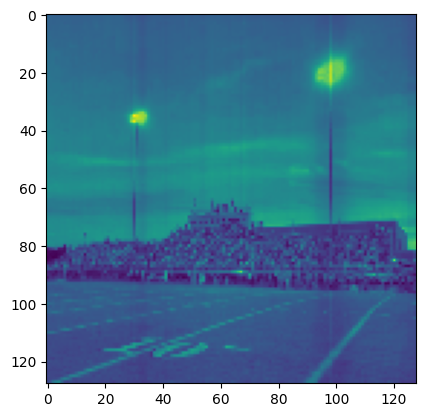

In [549]:
plt.imshow(test_img)

In [463]:
class_label_en = {
0: 'sky',
 1: 'tree',
 2: 'ceiling',
 3: 'building',
 4: 'person',
 5: 'road;route',
 6: 'car',
 7: 'sidewalk',
 8: 'grass',
 9: 'mountain',
 10: 'water',
 11: 'house',
 12: 'sea'}

class_colors_en = {
    0: (6, 230, 230),          
   1: (4, 200, 3),    
    2: (20, 120, 80),    
   3: (80, 120, 120),      
    4: (150, 5, 61),              
    5: (140, 140, 140),     
    6: (0, 102, 200), 
    7: (235, 255, 7),             
    8: (4, 250, 7),            
    9: (143, 255, 140),  
    10: (61, 230, 250),
    11:(255, 9, 224),
    12:(9, 7, 230) 
   
}      

In [550]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors_en.values())
for class_label, color in class_colors_en.items():
    rgb_image[predicted_img == class_label] = color
    

In [336]:
rgb_image.shape

(128, 128, 3)

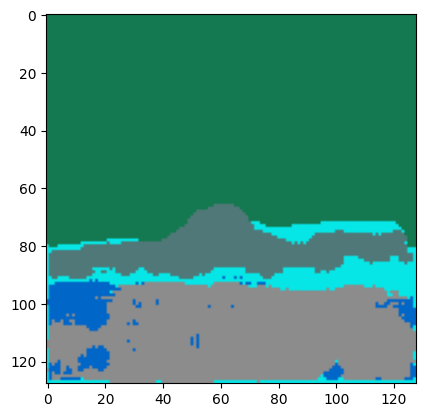

In [551]:
plt.imshow(rgb_image)

In [552]:
np.unique(rgb_image)

array([  0,   6,  20,  80, 102, 120, 140, 200, 230])

In [467]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [561]:
image_name = u'/kaggle/input/ade20k-scene-parsing/ADEChallengeData2016/images/training/ADE_train_00006012.jpg'
image = load_images_bw(image_name)
train_images = np.array(image[:,:,0])
train_images = np.expand_dims(train_images, axis=2)
train_images = normalize(train_images,axis=1)#

In [562]:
test_img_norm=train_images
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]

1/1 [==============================] - 0s 31ms/step


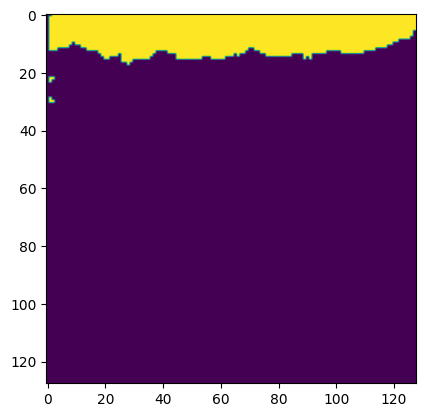

In [563]:
plt.imshow(predicted_img)

In [564]:
np.unique(predicted_img)

array([0, 4])

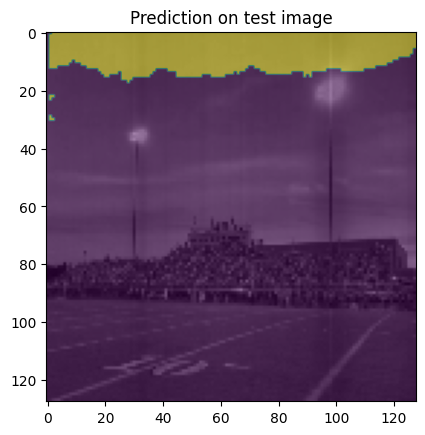

In [569]:

plt.title('Prediction on test image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.imshow(predicted_img,alpha=0.5)
plt.show()

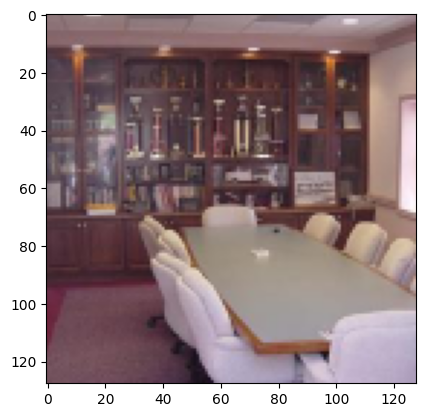

In [565]:
plt.imshow(image)

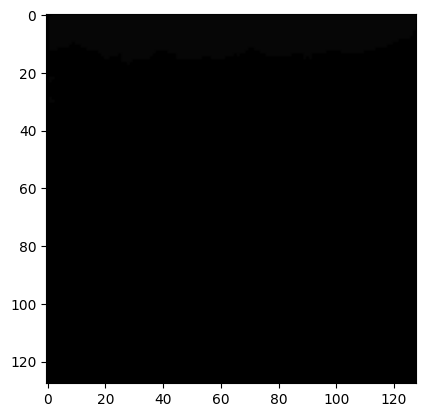

In [566]:
rgb_image = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)

for encoded, before_encode in class_encoding.items():
    rgb_image[predicted_img == encoded] = before_encode
plt.imshow(rgb_image,cmap='jet')

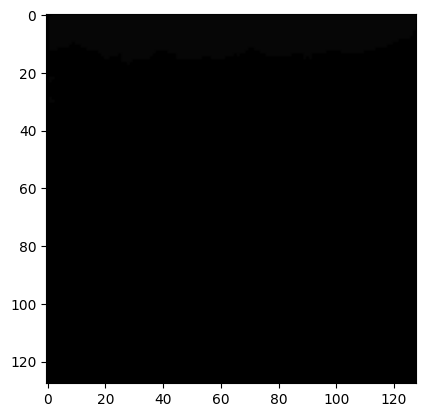

In [567]:
plt.imshow(rgb_image)

In [381]:
rgb_image.shape

(128, 128, 3)

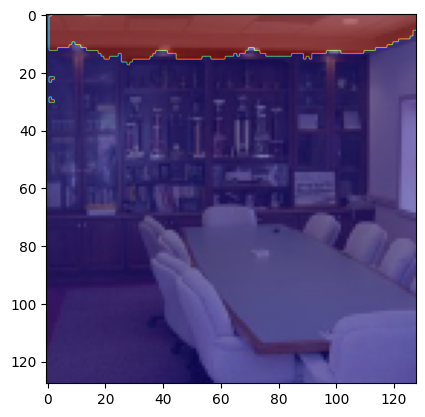

In [568]:
# Apply colors to the mask based on class labels
output = np.repeat(predicted_img[:, :, np.newaxis], 3, axis=2)
labels = list(class_colors.values())
for class_label, color in class_colors.items():
    output[predicted_img == class_label] = color  
plt.imshow(image,cmap='gray') 
plt.imshow(predicted_img, alpha=0.5,cmap='jet') # interpolation='none'


# Save the image shown in subplot (222)
plt.savefig('prediction_with_mask.png')  # Save the figure as an image file

-++
